# Metadata exploration

In [22]:
import json
import pandas as pd
from collections import Counter
import re
from pathlib import Path

file_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\meta_Cell_Phones_and_Accessories.jsonl')

model_counts = Counter()

# Common phone brands and their model patterns
pattern = re.compile(
    r'(iphone\s*\d+|'
    r'samsung\s+galaxy\s+[a-z]\d+|'
    r'galaxy\s+[a-z]\d+|'
    r'pixel\s+\d+|'
    r'oneplus\s+\d+|'
    r'moto\s+[a-z]\d+|'
    r'lg\s+[a-z]\d+|'
    r'huawei\s+[a-z]+\s*\d+|'
    r'xperia\s+\d+)',
    flags=re.IGNORECASE
)

with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        try:
            record = json.loads(line)
            title = record.get('title', '')
            matches = pattern.findall(title)
            for match in matches:
                model_counts[match.strip().lower()] += 1
        except json.JSONDecodeError:
            continue

print(f"{'Model':<40} {'Count':>8}")
print("-" * 50)
for model, count in sorted(model_counts.items(), key=lambda x: -x[1])[:50]:
    print(f"{model:<40} {count:>8}")

Model                                       Count
--------------------------------------------------
iphone 6                                   155505
iphone 7                                    83749
iphone 11                                   65699
iphone 5                                    65486
iphone 12                                   62940
iphone 8                                    52968
iphone 13                                   38503
iphone 4                                    30531
iphone 14                                   24770
samsung galaxy s7                           20056
samsung galaxy s10                          19391
samsung galaxy s9                           16434
samsung galaxy s6                           15970
samsung galaxy s8                           15861
samsung galaxy s20                          15419
samsung galaxy s21                          15174
galaxy s10                                  14468
galaxy s7                                   14227

Suitable phones to examine:
iPhone 13, 14, 15 (recent enough, high volume)
Samsung Galaxy S20, S21, S22, S23
Pixel 6, 7

In [23]:


file_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\meta_Electronics.jsonl')

category_counts = Counter()

with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        try:
            record = json.loads(line)
            cats = record.get('categories', [])
            if cats:
                # categories is a list — take the most specific one (last element)
                category_counts[cats[-1]] += 1
        except json.JSONDecodeError:
            continue

print(f"{'Category':<60} {'Count':>8}")
print("-" * 70)
for cat, count in sorted(category_counts.items(), key=lambda x: -x[1])[:50]:
    print(f"{cat:<60} {count:>8}")

Category                                                        Count
----------------------------------------------------------------------
Cases                                                          122696
Earbud Headphones                                               37403
Backgrounds                                                     32167
Traditional Laptops                                             30443
Remote Controls                                                 29973
USB Cables                                                      29235
Batteries                                                       22389
AC Adapters                                                     20044
Chargers & Adapters                                             19455
Skins & Decals                                                  18843
Sleeves                                                         18575
Arm & Wristband Accessories                                     17410
Screen Protectors  

In [24]:

laptop_counts = Counter()
tablet_counts = Counter()

title_pattern = re.compile(r'"title"\s*:\s*"([^"]+)"')

laptop_pattern = re.compile(
    r'(macbook\s*(pro|air)?|'
    r'dell\s+xps\s*\d*|'
    r'thinkpad\s*[a-z]?\d*|'
    r'surface\s+laptop\s*\d*|'
    r'hp\s+spectre|hp\s+envy|hp\s+pavilion|'
    r'asus\s+zenbook|asus\s+vivobook|'
    r'lenovo\s+ideapad|'
    r'acer\s+swift|acer\s+aspire)',
    flags=re.IGNORECASE
)

tablet_pattern = re.compile(
    r'(ipad\s*(pro|air|mini)?\s*\d*|'
    r'samsung\s+galaxy\s+tab\s*[a-z]?\d*|'
    r'surface\s+pro\s*\d*|'
    r'kindle\s*(fire|paperwhite)?|'
    r'lenovo\s+tab\s*\d*)',
    flags=re.IGNORECASE
)

with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        title_match = title_pattern.search(line)
        if not title_match:
            continue
        title = title_match.group(1)

        match = laptop_pattern.search(title)
        if match:
            laptop_counts[match.group(0).strip().lower()] += 1

        match = tablet_pattern.search(title)
        if match:
            tablet_counts[match.group(0).strip().lower()] += 1

print(" Laptops ")
print(f"{'Model':<40} {'Count':>8}")
print("-" * 50)
for model, count in sorted(laptop_counts.items(), key=lambda x: -x[1])[:30]:
    print(f"{model:<40} {count:>8}")

print("\n Tablets ")
print(f"{'Model':<40} {'Count':>8}")
print("-" * 50)
for model, count in sorted(tablet_counts.items(), key=lambda x: -x[1])[:30]:
    print(f"{model:<40} {count:>8}")

=== LAPTOPS ===
Model                                       Count
--------------------------------------------------
macbook pro                                 23781
macbook                                     15999
macbook air                                 12377
hp pavilion                                  8112
acer aspire                                  4557
lenovo ideapad                               4095
hp envy                                      3277
asus vivobook                                1124
hp spectre                                   1075
thinkpad x1                                   805
dell xps 13                                   733
dell xps 15                                   714
asus zenbook                                  710
surface laptop                                408
dell xps                                      386
thinkpad e                                    275
thinkpad y                                    268
thinkpad t480                    

Laptops suitable:
- MacBook Pro  (M1 Nov 2021, M2 Jun 2023 — two usable events)
- MacBook Air  (M1 Nov 2020, M2 Jun 2022)
- Dell XPS 13  (annual refreshes, decent count)

Tablets suitable:
- iPad Pro  (2021, 2022 models — strong counts)
- iPad Air  (5th gen Mar 2022)
- Samsung Galaxy Tab A  (multiple recent releases)
- Surface Pro  (Surface Pro 8, 2021)

In [25]:
#Getting the ASINs for the candidate products

# Defining candidate products
candidates = {
    # Hedonic - Phones
    'iPhone 13': r'iphone\s*13(?!\s*pro|\s*mini|\s*max)',
    'iPhone 14': r'iphone\s*14(?!\s*pro|\s*plus|\s*max)',
    'Samsung Galaxy S22': r'samsung\s+galaxy\s+s22(?!\s*ultra|\s*plus|\s*\+)',
    'Samsung Galaxy S23': r'samsung\s+galaxy\s+s23(?!\s*ultra|\s*plus|\s*\+)',
    # Utilitarian - Laptops
    'MacBook Pro M1': r'macbook\s+pro\s+m1',
    'MacBook Air M2': r'macbook\s+air\s+m2',
    'Dell XPS 13': r'dell\s+xps\s+13',
    # Utilitarian - Tablets
    'iPad Pro 2022': r'ipad\s+pro.*2022|ipad\s+pro.*m2',
    'iPad Air 5': r'ipad\s+air\s*(5|fifth|\(5th)',
    'Samsung Galaxy Tab A': r'samsung\s+galaxy\s+tab\s+a(?!7\s*lite)',
    'Surface Pro 8': r'surface\s+pro\s*8',
}

# Which file to search per product
phone_file = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\meta_Cell_Phones_and_Accessories.jsonl')
electronics_file = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\meta_Electronics.jsonl')

phone_products = ['iPhone 13', 'iPhone 14', 'Samsung Galaxy S22', 'Samsung Galaxy S23']
electronics_products = ['MacBook Pro M1', 'MacBook Air M2', 'Dell XPS 13', 
                        'iPad Pro 2022', 'iPad Air 5', 'Samsung Galaxy Tab A', 'Surface Pro 8']

title_pattern = re.compile(r'"title"\s*:\s*"([^"]+)"')
asin_pattern = re.compile(r'"parent_asin"\s*:\s*"([^"]+)"')

results = {}

def search_file(file_path, product_names):
    for product in product_names:
        results[product] = set()
    
    with open(file_path, 'r', encoding='utf-8') as f:
        for line in f:
            title_match = title_pattern.search(line)
            if not title_match:
                continue
            title = title_match.group(1)
            
            for product in product_names:
                if re.search(candidates[product], title, flags=re.IGNORECASE):
                    asin_match = asin_pattern.search(line)
                    if asin_match:
                        results[product].add(asin_match.group(1))

search_file(phone_file, phone_products)
search_file(electronics_file, electronics_products)

# Print results
for product, asins in results.items():
    print(f"\n{product} — {len(asins)} ASINs found")
    for asin in list(asins)[:10]:  # show first 10
        print(f"  {asin}")


iPhone 13 — 10418 ASINs found
  B0B6W6QKDD
  B0B3MP5GTN
  B0B4NFHB38
  B09NDGDS5C
  B09RD88DR4
  B09JK1XKJN
  B0B7LRMGH9
  B09M3V2BG8
  B08NW32DMJ
  B07YVLB9Z5

iPhone 14 — 8487 ASINs found
  B0BR3FZP88
  B07PRGSLZ8
  B0BFN9P4HR
  B0BZ38GXX7
  B09DT5WFSB
  B07YZLXMY3
  B07P54F2JH
  B0B2CLPQKT
  B0B6PLN6G1
  B097Q123T8

Samsung Galaxy S22 — 2785 ASINs found
  B09NDXHM3H
  B09QX65HCT
  B0C5MR9MYJ
  B0B1MCQ7V9
  B09PB9RJLT
  B09QSNXS1L
  B0BJQ82L85
  B09S5S3RWF
  B0BCWNDN97
  B0B84BNKW9

Samsung Galaxy S23 — 1281 ASINs found
  B0BY8N7YGP
  B0BSRHRH7L
  B09S346MTL
  B0C1BZ8JZB
  B0C66C7GDZ
  B0BQDPZJ3M
  B09YNL6JPP
  B098QMC7JX
  B0BNBPKP21
  B0BQ3QVB73

MacBook Pro M1 — 132 ASINs found
  B08393ZMX5
  B0BRMMN3B7
  B07B2S648N
  B0B458QQDM
  B0BZFVRSQB
  B07XTJCKXF
  B08MJXXW3G
  B08XXTMC9Y
  B0C3LRDCKS
  B0988TCFGW

MacBook Air M2 — 106 ASINs found
  B0BQHGBQHZ
  B0BYVQ6JHM
  B09HSRT8NG
  B005WZXR0S
  B0B6RKSWVD
  B07GH38FSH
  B0BBPV565Q
  B0BKSXQ9D3
  B0777LZVVV
  B09FPPY2YX

Dell XPS 13 

events = {
    # Hedonic - Phones
    'iPhone 13':            'B09LNX6KQS',
    'iPhone 14':            'B0BN94DL3R',
    'iPhone 15':            'B0CHX2F5QT',
    'Samsung Galaxy S20':   'B082VBHMS5',
    'Samsung Galaxy S21':   'B08VMBMFWZ',
    'Samsung Galaxy S22':   'B09MW16J9Z',
    'Samsung Galaxy S23':   'B0BLP4YPDJ',
    'Google Pixel 6':       'B09HJZPFH4',
    'Google Pixel 7':       'B0BCQD5J1Q',
    # Utilitarian - Laptops
    'MacBook Pro M1':       'B08N5M7S6K',
    'MacBook Pro M2':       'B0B3C2R8MP',
    'MacBook Air M2':       'B0B3C2R8MP',
    'Dell XPS 13':          'B09DFN5M18',
    # Utilitarian - Tablets
    'iPad Pro 2022':        'B0BJLF2BRM',
    'iPad Air 5':           'B09V3HN1KC',
    'iPad mini 6':          'B09G9BXKZM',
    'Samsung Galaxy Tab A': 'B08BLXF2BK',
    'Surface Pro 8':        'B09DKG9YTL',
}

In [30]:
candidates = {
    'iPhone 13':          r'iphone\s*13(?!\s*(pro|mini|max))',
    'iPhone 14':          r'iphone\s*14(?!\s*(pro|plus|max))',
    'iPhone 15':          r'iphone\s*15(?!\s*(pro|plus|max))',
    'Samsung Galaxy S20': r'samsung\s+galaxy\s+s20(?!\s*(ultra|plus|\+|fe))',
    'Samsung Galaxy S21': r'samsung\s+galaxy\s+s21(?!\s*(ultra|plus|\+|fe))',
    'Samsung Galaxy S22': r'samsung\s+galaxy\s+s22(?!\s*(ultra|plus|\+))',
    'Samsung Galaxy S23': r'samsung\s+galaxy\s+s23(?!\s*(ultra|plus|\+|fe))',
    'Google Pixel 6':     r'google\s+pixel\s+6(?!\s*(pro|a))',
    'Google Pixel 7':     r'google\s+pixel\s+7(?!\s*(pro|a))',
}

title_pattern    = re.compile(r'"title"\s*:\s*"([^"]+)"')
parent_pattern   = re.compile(r'"parent_asin"\s*:\s*"([^"]+)"')
category_pattern = re.compile(r'"categories"\s*:\s*\[([^\]]+)\]')

results = defaultdict(set)

with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        cat_match = category_pattern.search(line)
        if not cat_match or '"Cell Phones"' not in cat_match.group(1):
            continue

        title_match = title_pattern.search(line)
        if not title_match:
            continue
        title = title_match.group(1)

        for product, pattern in candidates.items():
            if re.search(pattern, title, flags=re.IGNORECASE):
                parent_match = parent_pattern.search(line)
                if parent_match:
                    results[product].add(parent_match.group(1))

for product, asins in results.items():
    print(f"\n{product} — {len(asins)} parent ASINs found")
    for asin in asins:
        print(f"  {asin}")


Samsung Galaxy S23 — 4 parent ASINs found
  B0BXKWGCSW
  B0BS4NBDCC
  B0BS3SQF1N
  B0CHZ8S5GY

Samsung Galaxy S20 — 25 parent ASINs found
  B0964B1MNX
  B0BJQVKWXL
  B08NWJ48RC
  B085F3NP61
  B089LGYQHQ
  B09739LDTM
  B085RSB62B
  B0BWTWDVM4
  B09Q1NDYPN
  B08973KMWG
  B09MDKLX31
  B089J22DMK
  B085F3QSPQ
  B09XJ8GRYR
  B085F3KYDP
  B08PFLPWMX
  B0896YZ4ZJ
  B084ZT23H7
  B084ZT7DX9
  B09DRJL17Q
  B08YRBH4GP
  B084GQ3KYM
  B09HFW8GRB
  B085M28YSS
  B089J81HCS

iPhone 13 — 1 parent ASINs found
  B09LP9P1FM

Google Pixel 6 — 9 parent ASINs found
  B09N83X1ZN
  B0BVL8SKFP
  B09K53SZBL
  B0BVL9H291
  B09J6ZXBWW
  B09K52TT5L
  B09TS3SGGZ
  B09L1N89VJ
  B0BCZM9XV2

Samsung Galaxy S21 — 27 parent ASINs found
  B0932C7NQ1
  B09478TZZY
  B091NDMP7K
  B094GG73X2
  B08VF5ZVNB
  B08X6Q3254
  B08WF93R89
  B094GF7GVV
  B08SXRTNMS
  B0BNR5MXSY
  B08WCQ8J79
  B08X2MS5SC
  B0C3PDSZ4R
  B08F8LBVNW
  B09151RRR3
  B092DWML3H
  B08VLMQ3KS
  B094GDL189
  B09S6V72Y7
  B0933JJCNK
  B0934RR19J
  B08X6FMX14
  B

In [83]:
import re
from collections import defaultdict
from pathlib import Path

# ── CONFIGURATION ─────────────────────────────────────────────
# Edit only this block. Everything downstream derives from it.

BRANDS = ['Apple', 'Samsung', 'Google', 'LG', 'Motorola']
YEAR_RANGE = (2019, 2023)  # inclusive on both ends

# US store availability dates only (not announcement, not global)
US_LAUNCH_DATES = {
    # ── Apple ─────────────────────────────────────────────────
    'iPhone 11':              '2019-09-20',
    'iPhone 12':              '2020-10-23',
    'iPhone 13':              '2021-09-24',
    'iPhone 14':              '2022-09-16',
    'iPhone 15':              '2023-09-22',
    # ── Samsung Galaxy S ──────────────────────────────────────
    'Samsung Galaxy S10':     '2019-03-08',
    'Samsung Galaxy S20':     '2020-03-06',
    'Samsung Galaxy S21':     '2021-01-29',
    'Samsung Galaxy S22':     '2022-02-25',  # NOT the Feb 9 announcement
    'Samsung Galaxy S23':     '2023-02-17',  # NOT the Feb 1 announcement
    # ── Google Pixel ──────────────────────────────────────────
    'Google Pixel 4':         '2019-10-24',
    'Google Pixel 5':         '2020-10-15',
    'Google Pixel 6':         '2021-10-28',
    'Google Pixel 7':         '2022-10-13',
    # ── LG (discontinued Apr 2021 — no entries after) ─────────
    'LG G8 ThinQ':            '2019-03-22',
    'LG V60 ThinQ':           '2020-03-05',
    'LG Velvet':              '2020-10-29',
    'LG Wing':                '2020-10-15',
    # ── Motorola ──────────────────────────────────────────────
    'Motorola Edge+':         '2020-04-23',
    'Moto G Power 2021':      '2021-02-25',
    'Motorola Edge+ 2022':    '2022-06-09',
    'Moto G Stylus 5G 2022':  '2022-03-03',
}

# Regex patterns — base model only, negative lookaheads exclude
# Pro / Plus / Ultra / Mini / FE / XL / A variants
_PATTERNS = {
    'iPhone 11':              r'iphone\s*11(?!\s*(pro|max))',
    'iPhone 12':              r'iphone\s*12(?!\s*(pro|mini|max))',
    'iPhone 13':              r'iphone\s*13(?!\s*(pro|mini|max))',
    'iPhone 14':              r'iphone\s*14(?!\s*(pro|plus|max))',
    'iPhone 15':              r'iphone\s*15(?!\s*(pro|plus|max))',
    'Samsung Galaxy S10':     r'samsung\s+galaxy\s+s10(?!\s*(plus|\+|e|5g))',
    'Samsung Galaxy S20':     r'samsung\s+galaxy\s+s20(?!\s*(ultra|plus|\+|fe|5g))',
    'Samsung Galaxy S21':     r'samsung\s+galaxy\s+s21(?!\s*(ultra|plus|\+|fe))',
    'Samsung Galaxy S22':     r'samsung\s+galaxy\s+s22(?!\s*(ultra|plus|\+))',
    'Samsung Galaxy S23':     r'samsung\s+galaxy\s+s23(?!\s*(ultra|plus|\+|fe))',
    'Google Pixel 4':         r'google\s+pixel\s+4(?!\s*(xl|a))',
    'Google Pixel 5':         r'google\s+pixel\s+5(?!\s*a)',
    'Google Pixel 6':         r'google\s+pixel\s+6(?!\s*(pro|a))',
    'Google Pixel 7':         r'google\s+pixel\s+7(?!\s*(pro|a))',
    'LG G8 ThinQ':            r'lg\s+g8(?:\s+thinq)?(?!\s*x)',
    'LG V60 ThinQ':           r'lg\s+v60(?:\s+thinq)?',
    'LG Velvet':              r'lg\s+velvet(?!\s*4g)',
    'LG Wing':                r'lg\s+wing(?!\s*5g\s*uw)',
    'Motorola Edge+':         r'motorola\s+edge\s*\+(?!\s*5g|\s*2022|\s*20[0-9]{2})',
    'Moto G Power 2021':      r'moto(?:rola)?\s+(?:moto\s+)?g\s+power[^\d]*2021',
    'Motorola Edge+ 2022':    r'motorola\s+edge\s*\+[^\d]*2022',
    'Moto G Stylus 5G 2022':  r'moto(?:rola)?\s+(?:moto\s+)?g\s+stylus\s+5g[^\d]*2022',
}

# ── Auto-derive scope ─────────────────────────────────────────
BRAND_PREFIX = {
    'Apple':    ['iPhone'],
    'Samsung':  ['Samsung Galaxy S'],
    'Google':   ['Google Pixel'],
    'LG':       ['LG '],
    'Motorola': ['Motorola', 'Moto '],
}

def in_scope(name, date_str):
    year = int(date_str[:4])
    brand_ok = any(name.startswith(p) for b in BRANDS for p in BRAND_PREFIX[b])
    return brand_ok and YEAR_RANGE[0] <= year <= YEAR_RANGE[1]

launch_dates = {p: d for p, d in US_LAUNCH_DATES.items() if in_scope(p, d)}
candidates   = {p: _PATTERNS[p] for p in launch_dates}

print(f"Active launch events ({len(launch_dates)}):")
for p, d in sorted(launch_dates.items(), key=lambda x: x[1]):
    print(f"  {d}  {p}")

# ── ASIN search ───────────────────────────────────────────────
file_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Meta\meta_Cell_Phones_and_Accessories.jsonl')

title_pattern    = re.compile(r'"title"\s*:\s*"([^"]+)"')
parent_pattern   = re.compile(r'"parent_asin"\s*:\s*"([^"]+)"')
category_pattern = re.compile(r'"categories"\s*:\s*\[([^\]]+)\]')

asin_results = defaultdict(dict)   # product → {asin: title}

with open(file_path, 'r', encoding='utf-8') as f:
    for line in f:
        cat_match = category_pattern.search(line)
        if not cat_match or '"Cell Phones"' not in cat_match.group(1):
            continue
        title_match = title_pattern.search(line)
        if not title_match:
            continue
        title = title_match.group(1)
        for product, pattern in candidates.items():
            if re.search(pattern, title, flags=re.IGNORECASE):
                parent_match = parent_pattern.search(line)
                if parent_match:
                    asin = parent_match.group(1)
                    if asin not in asin_results[product]:
                        asin_results[product][asin] = title

for product, asin_dict in asin_results.items():
    print(f"\n{product}  —  {len(asin_dict)} parent ASINs")
    for asin, title in asin_dict.items():
        print(f"  {asin}  |  {title[:70]}")

Active launch events (22):
  2019-03-08  Samsung Galaxy S10
  2019-03-22  LG G8 ThinQ
  2019-09-20  iPhone 11
  2019-10-24  Google Pixel 4
  2020-03-05  LG V60 ThinQ
  2020-03-06  Samsung Galaxy S20
  2020-04-23  Motorola Edge+
  2020-10-15  Google Pixel 5
  2020-10-15  LG Wing
  2020-10-23  iPhone 12
  2020-10-29  LG Velvet
  2021-01-29  Samsung Galaxy S21
  2021-02-25  Moto G Power 2021
  2021-09-24  iPhone 13
  2021-10-28  Google Pixel 6
  2022-02-25  Samsung Galaxy S22
  2022-03-03  Moto G Stylus 5G 2022
  2022-06-09  Motorola Edge+ 2022
  2022-09-16  iPhone 14
  2022-10-13  Google Pixel 7
  2023-02-17  Samsung Galaxy S23
  2023-09-22  iPhone 15

Samsung Galaxy S23  —  4 parent ASINs
  B0BXKWGCSW  |  SAMSUNG Galaxy S23 Cell Phone, Factory Unlocked Android Smartphone, 25
  B0BS4NBDCC  |  Samsung Galaxy S23 Cell Phone + $50 Amazon Gift Card Bundle, Factory U
  B0BS3SQF1N  |  Samsung Galaxy S23 Cell Phone + $50 Amazon Gift Card Bundle, Factory U
  B0CHZ8S5GY  |  SAMSUNG Galaxy S23 5G 

# EDA - Phones

## Set up, ASIN search & product selection

In [76]:
#Importing packages
import os
from pathlib import Path

# For JSON parsing and text processing
import json
import math

# For SQL queries
import duckdb

# For plotting and data manipulation
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd


In [109]:
# Populate from ASIN search output above.
# Products with [] have not yet been searched — run Cell 1 and fill in.
candidate_asins = {
    # ── Apple ─────────────────────────────────────────────────
    'iPhone 11':              ['B08126B44P', 'B099RCQZ8Z', 'B08M5RFKWK', 'B07Y3LNH5Q'],
                               # B0BW9XJ5XC excluded — third-party clone, not Apple
    'iPhone 12':              ['B09JFLKR3H', 'B09JFQ3P7B', 'B09JF7QNZV',
                               'B09JFVZJHF', 'B09JFTPQY1'],
    'iPhone 13':              ['B09LP9P1FM'],
    'iPhone 14':              ['B0BY5V81ST', 'B0BZ9N1QQC'],
    'iPhone 15':              [],                # not found in metadata — check file coverage
    # ── Samsung ───────────────────────────────────────────────
    'Samsung Galaxy S10':     ['B07V4FNQNQ', 'B0BM3F9RK1', 'B089HYSJXZ',
                               'B07NNWCS35', 'B086R76SXZ',
                               # ↓ S10 Lite (G770) — different SKU, review post-launch
                               'B083WNBLTH', 'B08WK79K7K', 'B08H89NT8R',
                               'B085LV2XSX', 'B085VKW8K5', 'B083WNM77Q',
                               'B083WNB823', 'B08GF79WHM', 'B08GF96ZTR',
                               # ↓ S10 5G (G977) — different SKU, review post-launch
                               'B0BL2GVG1P', 'B08FNRT8DR'],
                               # NOTE: regex missed Lite/5G — consider splitting into
                               # separate events or tightening pattern to SM-G973 only
    'Samsung Galaxy S20':     ['B0BWTWDVM4', 'B085F3NP61', 'B085F3QSPQ', 'B085F3KYDP',
                               'B085RSB62B', 'B084ZT23H7', 'B084ZT7DX9', 'B084GQ3KYM',
                               'B0896YZ4ZJ', 'B089J22DMK', 'B089J81HCS', 'B08973KMWG',
                               'B08NWJ48RC', 'B08PFLPWMX', 'B08YRBH4GP', 'B09739LDTM',
                               'B089LGYQHQ', 'B0BJQVKWXL', 'B09Q1NDYPN', 'B09XJ8GRYR',
                               'B09MDKLX31', 'B09DRJL17Q', 'B09HFW8GRB', 'B0964B1MNX',
                               'B085M28YSS'],
    'Samsung Galaxy S21':     ['B08VF5ZVNB', 'B08WCQ8J79', 'B08WF93R89', 'B08X6Q3254',
                               'B08X6FMX14', 'B08X2MS5SC', 'B08XLYY4TW', 'B08SXRTNMS',
                               'B08F8LBVNW', 'B091NDMP7K', 'B092CMB89P', 'B092DWML3H',
                               'B094GG73X2', 'B094GDL189', 'B094GF7GVV', 'B09151RRR3',
                               'B09219GM34', 'B09478TZZY', 'B09478NYGJ', 'B09M2MZ1XR',
                               'B09S6V72Y7', 'B0932C7NQ1', 'B0933JJCNK', 'B0934RR19J',
                               'B08VLMQ3KS', 'B0BNR5MXSY', 'B0C3PDSZ4R'],
    'Samsung Galaxy S22':     ['B09WT8N5X7', 'B0B354WF9M', 'B0B496PPTG', 'B0B4V8V68T',
                               'B0B57Q52ZP', 'B0B6RYP6P8', 'B0B7TYLZ2X', 'B0B2XVM74H',
                               'B0BFYTZ5MG', 'B0BV4JX6KQ', 'B0BV88127N'],
    'Samsung Galaxy S23':     ['B0BXKWGCSW', 'B0BS4NBDCC', 'B0BS3SQF1N', 'B0CHZ8S5GY'],
    # ── Google ────────────────────────────────────────────────
    'Google Pixel 4':         ['B0884ZX4CX', 'B09B2W4Q8Q', 'B084HN8V35', 'B0884YJ9TR',
                               'B084HMRCQ1', 'B0884PM64F', 'B082G5DJSH', 'B081H1J55J',
                               'B084HMNKYS', 'B09449Q6GW', 'B084112BF6', 'B0884WCJFZ',
                               'B09446WM4G'],
    'Google Pixel 5':         ['B08JR6Y1KJ', 'B08MTQ3FQJ', 'B09ZGGM1X7', 'B08PQ2JN3T'],
    'Google Pixel 6':         ['B09J6ZXBWW', 'B09K52TT5L', 'B09K53SZBL', 'B09L1N89VJ',
                               'B09N83X1ZN', 'B09TS3SGGZ', 'B0BVL8SKFP', 'B0BVL9H291',
                               'B0BCZM9XV2'],
    'Google Pixel 7':         ['B0BL5PDH2L', 'B0C24XTSDQ'],
    # ── LG ────────────────────────────────────────────────────
    'LG G8 ThinQ':            ['B07Y3X3FNF', 'B07V9X47LK', 'B08R57LXTS', 'B08N5CYNFG',
                               'B08S96QTXS', 'B07Z88D6FT', 'B08J5NQ2BV', 'B08THYKNBH',
                               'B07TVKM1YG', 'B083F3MVKZ', 'B07Z4JSX3G', 'B08R5B42R6',
                               'B09XRHLP7R', 'B08R7RLNP4', 'B07RZMMDFC', 'B084BP1FVZ',
                               'B085RHXR11', 'B08C4P21J3', 'B07TZKRTPV'],
                               # B07XHG2G3L, B07ZQST5XR, B082YDN1YC, B07KVW2F36
                               # excluded — all G8s ThinQ (6.21", different model)
    'LG V60 ThinQ':           ['B08R5HWDZW', 'B08LQRZ7RV', 'B08F5JQT1C', 'B08S1TLPKB',
                               'B08J49MMS5', 'B08L1FZQ31', 'B08FKYPC7F', 'B08JRVMXMM',
                               'B08FL1N9V3'],
    'LG Velvet':              ['B0921NWKX3', 'B0B6RXJB7C', 'B092PNGDDH', 'B089P266SZ',
                               'B093F3FVQC', 'B08MBF8PWG', 'B0BT71S63H', 'B08WJMDWT8',
                               'B08YR5WN6D', 'B08CRWT6T2', 'B08YL6SS2P'],
    'LG Wing':                ['B08W8Q9QDH', 'B093XCL8PZ', 'B09XGZYPY6'],
    # ── Motorola ──────────────────────────────────────────────
    'Motorola Edge+':         ['B08T6MT9TB', 'B0B2F5W64J', 'B0B6RW2ZK5'],
                               # B09YN8CPX3, B0BLR46Y13 → assigned to Edge+ 2022 below
                               # B0C2W7YYHM excluded — 2023, outside YEAR_RANGE
    'Moto G Power 2021':      ['B095XDQ5D2', 'B0BHSHQGNG', 'B08TVF4W87',
                               'B0B6RY1CVS', 'B09X7DNR53'],
    'Motorola Edge+ 2022':    ['B09YN8CPX3', 'B0BLR46Y13'],
    'Moto G Stylus 5G 2022':  ['B09WCRF1RQ', 'B0B1WKFRPP', 'B0BS4GZQRS'],
}

populated = {p: v for p, v in candidate_asins.items() if v}
pending   = [p for p, v in candidate_asins.items() if not v]
print(f"Populated: {len(populated)} products | Pending: {len(pending)}")
if pending:
    print("  Pending:", ", ".join(pending))

Populated: 21 products | Pending: 1
  Pending: iPhone 15


In [110]:
# Setting up — palette, plot style, DuckDB connection
# launch_dates and candidate_asins are already defined above; no redeclaration here.

LIGHT_BLUE='#8fd7d7'; MED_BLUE='#00b0be'; LIGHT_PINK='#ff8ca1'; MED_PINK='#f45f74'
LIGHT_GREEN='#bdd373'; MED_GREEN='#98c127'; LIGHT_ORANGE='#ffcd8e'; MED_ORANGE='#ffb255'
PALETTE = [MED_BLUE, MED_PINK, MED_GREEN, MED_ORANGE, LIGHT_BLUE, LIGHT_PINK, LIGHT_GREEN, LIGHT_ORANGE]

plt.rcParams.update({
    'font.family': 'sans-serif', 'axes.spines.top': False, 'axes.spines.right': False,
    'axes.grid': True, 'grid.color': '#eeeeee', 'grid.linewidth': 0.8,
    'axes.facecolor': '#fafafa', 'figure.facecolor': 'white',
})

conn = duckdb.connect()

# Only run EDA on products that have ASINs — keeps plots clean while
# new brands are being searched. Swap the filter out once all are populated.
candidate_asins_active = {p: v for p, v in candidate_asins.items() if v}
print(f"EDA will run on {len(candidate_asins_active)} products:")
for p in candidate_asins_active:
    print(f"  {p}  ({len(candidate_asins_active[p])} ASINs)")


EDA will run on 21 products:
  iPhone 11  (4 ASINs)
  iPhone 12  (5 ASINs)
  iPhone 13  (1 ASINs)
  iPhone 14  (2 ASINs)
  Samsung Galaxy S10  (16 ASINs)
  Samsung Galaxy S20  (25 ASINs)
  Samsung Galaxy S21  (27 ASINs)
  Samsung Galaxy S22  (11 ASINs)
  Samsung Galaxy S23  (4 ASINs)
  Google Pixel 4  (13 ASINs)
  Google Pixel 5  (4 ASINs)
  Google Pixel 6  (9 ASINs)
  Google Pixel 7  (2 ASINs)
  LG G8 ThinQ  (19 ASINs)
  LG V60 ThinQ  (9 ASINs)
  LG Velvet  (11 ASINs)
  LG Wing  (3 ASINs)
  Motorola Edge+  (3 ASINs)
  Moto G Power 2021  (5 ASINs)
  Motorola Edge+ 2022  (2 ASINs)
  Moto G Stylus 5G 2022  (3 ASINs)


In [111]:
#Loading the file and seeing size + rows

file_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Phones\Cell_Phones_and_Accessories.jsonl')

size_bytes = os.path.getsize(file_path)
print(f"File size: {size_bytes / 1e9:.2f} GB")

# Count rows - takes ~1 min on large files
with open(file_path, 'rb') as f:
    row_count = sum(1 for _ in f)
print(f"Total rows: {row_count:,}")

File size: 9.34 GB
Total rows: 20,812,945


In [112]:
# Checking field names
with open(file_path, 'r', encoding='utf-8') as f:
    for i, line in enumerate(f):
        record = json.loads(line.strip())
        print(f"\n--- Record {i+1} fields ---")
        print(list(record.keys()))
        if i == 2:
            break


--- Record 1 fields ---
['rating', 'title', 'text', 'images', 'asin', 'parent_asin', 'user_id', 'timestamp', 'helpful_vote', 'verified_purchase']

--- Record 2 fields ---
['rating', 'title', 'text', 'images', 'asin', 'parent_asin', 'user_id', 'timestamp', 'helpful_vote', 'verified_purchase']

--- Record 3 fields ---
['rating', 'title', 'text', 'images', 'asin', 'parent_asin', 'user_id', 'timestamp', 'helpful_vote', 'verified_purchase']


In [113]:
# DuckDB test

conn = duckdb.connect()

result = conn.execute(f"""
    SELECT *
    FROM read_json_auto('{str(file_path).replace(chr(92), '/')}')
    LIMIT 3
""").df()

print(result.columns.tolist())
print(result.head(3))

['rating', 'title', 'text', 'images', 'asin', 'parent_asin', 'user_id', 'timestamp', 'helpful_vote', 'verified_purchase']
   rating                                title  \
0     4.0     No white background! It’s clear!   
1     5.0  Awesome!  Great price!  Works well!   
2     5.0   Worked but took an hour to install   

                                                text  \
0  I bought this bc I thought it had the nice whi...   
1  Perfect. How pissed am I that I recently paid ...   
2  Overall very happy with the end result. If you...   

                                              images        asin parent_asin  \
0  [{'small_image_url': 'https://images-na.ssl-im...  B08L6L3X1S  B08L6L3X1S   
1                                                 []  B079BPGF6C  B079BPGF6C   
2  [{'small_image_url': 'https://m.media-amazon.c...  B088DR7Z5B  B0BBGGC8F2   

                        user_id      timestamp  helpful_vote  \
0  AFKZENTNBQ7A7V7UXW5JJI6UGRYQ  1612044451196             0   
1  

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Rating Distribution
 rating    count   pct
    1.0  2802212 13.46
    2.0  1251658  6.01
    3.0  1543387  7.42
    4.0  2446330 11.75
    5.0 12769358 61.35

Verified Purchase rate
 verified_purchase    count   pct
             False  1086754  5.22
              True 19726191 94.78

Review Volume by Year
 year   count
 1998       1
 1999       2
 2000      67
 2001     158
 2002     232
 2003     341
 2004     929
 2005    2076
 2006    3139
 2007    5145
 2008    7783
 2009   14668
 2010   34807
 2011   84287
 2012  205489
 2013  567034
 2014  928711
 2015 1472977
 2016 1699587
 2017 1765561
 2018 1960820
 2019 2901610
 2020 2902424
 2021 2879875
 2022 2380445
 2023  994777

Text Length Distribution
count    20812945.0
mean          175.6
std           267.1
min             0.0
25%            42.0
50%           102.0
75%           211.0
max         33535.0
Name: text_length, dtype: float64


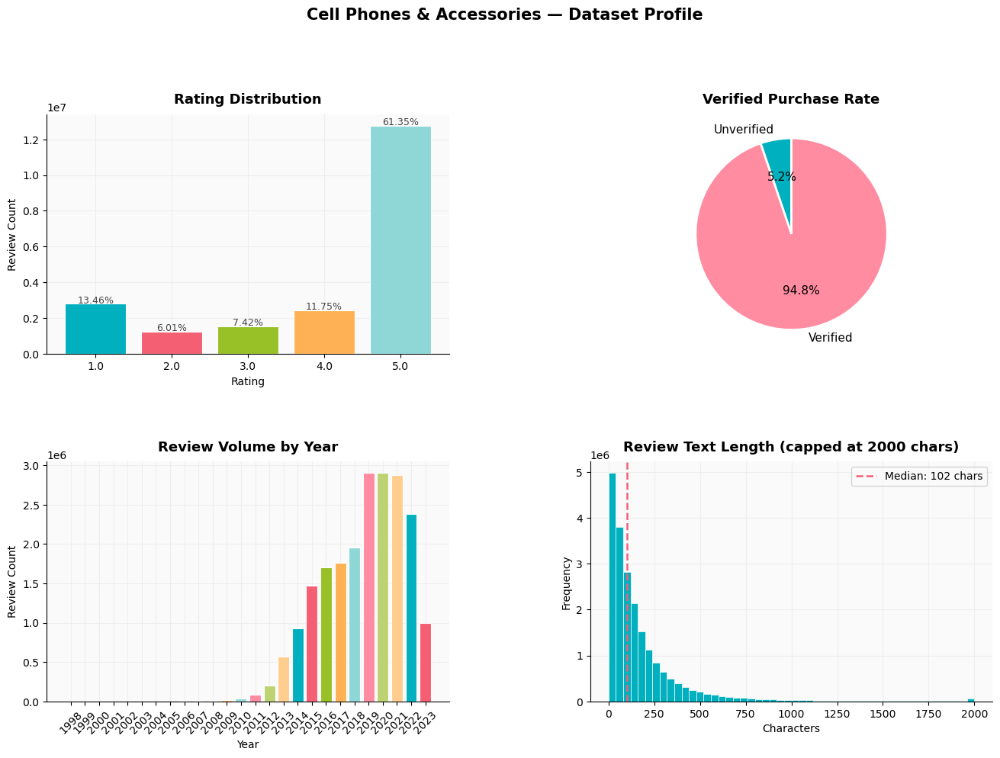

Saved to eda_profile.png


In [114]:
#Overall dataset profile using DuckDB

file_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Phones\Cell_Phones_and_Accessories.jsonl')
fp = str(file_path).replace('\\', '/')

conn = duckdb.connect()

# Getting the data
rating_df = conn.execute(f"""
    SELECT rating, COUNT(*) as count,
           ROUND(COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (), 2) as pct
    FROM read_json_auto('{fp}')
    GROUP BY rating ORDER BY rating
""").df()

verified_df = conn.execute(f"""
    SELECT verified_purchase, COUNT(*) as count,
           ROUND(COUNT(*) * 100.0 / SUM(COUNT(*)) OVER (), 2) as pct
    FROM read_json_auto('{fp}')
    GROUP BY verified_purchase
""").df()

volume_df = conn.execute(f"""
    SELECT YEAR(epoch_ms(timestamp)) as year, COUNT(*) as count
    FROM read_json_auto('{fp}')
    GROUP BY year ORDER BY year
""").df()

textlen_df = conn.execute(f"""
    SELECT len(text) as text_length
    FROM read_json_auto('{fp}')
    WHERE text IS NOT NULL
""").df()

# Printing summaries
print("Rating Distribution")
print(rating_df.to_string(index=False))
print("\nVerified Purchase rate")
print(verified_df.to_string(index=False))
print("\nReview Volume by Year")
print(volume_df.to_string(index=False))
print("\nText Length Distribution")
print(textlen_df['text_length'].describe().round(1))

#Plots
plt.rcParams.update({
    'font.family': 'sans-serif',
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.color': '#eeeeee',
    'grid.linewidth': 0.8,
    'axes.facecolor': '#fafafa',
    'figure.facecolor': 'white',
})

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, hspace=0.45, wspace=0.35)

# 1. Rating distribution — each bar a different colour
ax1 = fig.add_subplot(gs[0, 0])
bars = ax1.bar(
    rating_df['rating'].astype(str),
    rating_df['count'],
    color=PALETTE[:len(rating_df)],
    edgecolor='white', linewidth=0.8, zorder=3
)
ax1.set_title('Rating Distribution', fontsize=13, fontweight='bold', pad=10)
ax1.set_xlabel('Rating')
ax1.set_ylabel('Review Count')
for bar, pct in zip(bars, rating_df['pct']):
    ax1.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + 30000,
             f'{pct}%', ha='center', fontsize=9, color='#444444')

# 2. Verified purchase pie
ax2 = fig.add_subplot(gs[0, 1])
verified_df['label'] = verified_df['verified_purchase'].map({True: 'Verified', False: 'Unverified'})
ax2.pie(
    verified_df['count'],
    labels=verified_df['label'],
    autopct='%1.1f%%',
    colors=[MED_BLUE, LIGHT_PINK],
    startangle=90,
    textprops={'fontsize': 11},
    wedgeprops={'edgecolor': 'white', 'linewidth': 2}
)
ax2.set_title('Verified Purchase Rate', fontsize=13, fontweight='bold', pad=10)

# 3. Review volume by year — alternating light/dark pairs
ax3 = fig.add_subplot(gs[1, 0])
year_colors = [PALETTE[i % len(PALETTE)] for i in range(len(volume_df))]
ax3.bar(
    volume_df['year'].astype(str),
    volume_df['count'],
    color=year_colors,
    edgecolor='white', linewidth=0.8, zorder=3
)
ax3.set_title('Review Volume by Year', fontsize=13, fontweight='bold', pad=10)
ax3.set_xlabel('Year')
ax3.set_ylabel('Review Count')
ax3.tick_params(axis='x', rotation=45)

# 4. Text length histogram
ax4 = fig.add_subplot(gs[1, 1])
clipped = textlen_df['text_length'].clip(upper=2000)
ax4.hist(clipped, bins=50, color=MED_BLUE, edgecolor='white', linewidth=0.5, zorder=3)
median_val = textlen_df['text_length'].median()
ax4.axvline(median_val, color=MED_PINK, linestyle='--',
            linewidth=1.8, label=f'Median: {median_val:.0f} chars', zorder=4)
ax4.set_title('Review Text Length (capped at 2000 chars)', fontsize=13, fontweight='bold', pad=10)
ax4.set_xlabel('Characters')
ax4.set_ylabel('Frequency')
ax4.legend(fontsize=10)

plt.suptitle('Cell Phones & Accessories — Dataset Profile',
             fontsize=15, fontweight='bold', y=1.02)
plt.savefig('eda_profile.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved to eda_profile.png")

In [115]:
reviews_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Phones\Cell_Phones_and_Accessories.jsonl')
meta_path = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Meta\meta_Cell_Phones_and_Accessories.jsonl')

rp = str(reviews_path).replace('\\', '/')
mp = str(meta_path).replace('\\', '/')

conn = duckdb.connect()

top_products = conn.execute(f"""
    WITH review_counts AS (
        SELECT parent_asin,
               COUNT(*) as review_count,
               ROUND(AVG(rating), 2) as avg_rating,
               MIN(epoch_ms(timestamp))::DATE as first_review,
               MAX(epoch_ms(timestamp))::DATE as last_review
        FROM read_json_auto('{rp}')
        GROUP BY parent_asin
        ORDER BY review_count DESC
        LIMIT 50
    ),
    meta AS (
        SELECT parent_asin,
               title
        FROM read_json_auto('{mp}')
        QUALIFY ROW_NUMBER() OVER (PARTITION BY parent_asin ORDER BY title) = 1
    )
    SELECT r.parent_asin,
           m.title,
           r.review_count,
           r.avg_rating,
           r.first_review,
           r.last_review
    FROM review_counts r
    LEFT JOIN meta m ON r.parent_asin = m.parent_asin
    ORDER BY r.review_count DESC
""").df()

print(top_products.to_string(index=False))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

parent_asin                                                                                                                                                                                                    title  review_count  avg_rating first_review last_review
 B01415QHYW                                                                                           amFilm Screen Protector 4.7“ for Apple iPhone 8, iPhone 7, iPhone 6S and iPhone 6, Tempered Glass 4.7“, 2 Pack         43237        4.29   2015-08-28  2023-08-22
 B07P9S6R9Y     Yootech Wireless Charger,10W Max Fast Wireless Charging Pad Compatible with iPhone 14/14 Plus/14 Pro/14 Pro Max/13/13 Mini/SE 2022/12/11/X/8,Samsung Galaxy S22/S21/S20,AirPods Pro 2(No AC Adapter)         29311        4.02   2018-03-31  2023-09-02
 B073R68TSH                  Beam Electronics Car Phone Holder Mount, Phone Car Air Vent Mount Holder Cradle Compatible for iPhone 12 11 Pro Max XS XS XR X 8+ 7+ SE 6s 6+ 5s 4 Samsung Galaxy S4-S10 LG Nexus N

In [116]:
for product, asins in candidate_asins.items():
    if not asins:
        print(f"{product:<30} — no ASINs yet, skipping")
        continue

    asin_list = ", ".join(f"'{a}'" for a in asins)
    result = conn.execute(f"""
        SELECT '{product}' as product,
               COUNT(*) as total_reviews,
               ROUND(AVG(rating), 2) as avg_rating,
               MIN(epoch_ms(timestamp))::DATE as first_review,
               MAX(epoch_ms(timestamp))::DATE as last_review,
               COUNT(DISTINCT asin) as variant_count,
               COUNT(DISTINCT parent_asin) as parent_count
        FROM read_json_auto('{rp}')
        WHERE parent_asin IN ({asin_list})
    """).df()
    print(result.to_string(index=False))
    print()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
iPhone 11            280         4.1   2020-01-08  2023-08-25             25             4



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
iPhone 12             26        4.31   2022-04-03  2023-08-06              5             5



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
iPhone 13            280        4.11   2022-03-08  2023-08-25             35             1



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
iPhone 14             83        4.18   2022-12-29  2023-08-24             18             2

iPhone 15                      — no ASINs yet, skipping


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

           product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Samsung Galaxy S10            420        3.89   2020-05-11  2023-08-05             21            16



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

           product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Samsung Galaxy S20           1055        3.71   2020-03-07  2023-08-31             42            25



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

           product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Samsung Galaxy S21           1427        3.54   2021-01-29  2023-09-04             39            27



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

           product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Samsung Galaxy S22            100        3.86   2022-07-02  2023-08-21             20            11



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

           product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Samsung Galaxy S23            273        4.21   2023-02-17  2023-08-30             27             4



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

       product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Google Pixel 4             68        3.88   2020-01-16  2023-08-20             13            13



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

       product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Google Pixel 5            883        3.51   2020-10-29  2023-08-24              8             4



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

       product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Google Pixel 6            628        3.66   2021-10-28  2023-09-04             17             9



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

       product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Google Pixel 7             17        3.41   2023-01-20  2023-07-24              3             2



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

    product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
LG G8 ThinQ            962        3.86   2019-05-28  2023-06-23             26            19



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

     product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
LG V60 ThinQ            611        3.57   2020-10-14  2023-08-30             12             9



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
LG Velvet            399        3.55   2020-12-01  2023-07-24             12            11



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
LG Wing             62        3.74   2021-04-10  2023-04-28              3             3



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

       product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Motorola Edge+             12        2.92   2021-04-19  2022-11-23              3             3



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

          product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Moto G Power 2021             39        3.21   2021-04-05  2023-07-31              5             5



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

            product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Motorola Edge+ 2022             85        3.51   2022-04-20  2023-07-20              4             2



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

              product  total_reviews  avg_rating first_review last_review  variant_count  parent_count
Moto G Stylus 5G 2022            105        3.79   2022-05-22  2023-06-15              3             3



So, at the moment, the situation looks like this:
1. Tier 1 candidates (volume good, lag minimal)
- Samsung Galaxy S21 - 1427 
- Samsung Galaxy S20 - 1055
- Google Pixel 5 - 883
- Google Pixel 6 - 628 reviews
- LG G8 ThinQ - 962 reviews
- LG V60 ThinQ - 611 
- LG Velvet - 399
- Samsung Galaxy S23 - 273
- iPhone 11 - 280
- iPhone 13 - 280
- Samsung Galaxy S10 - 420

2. Tier 2 candidates (volume is borderline, lag varies)
- Moto G Stylus 5G 2022 - 105
- Motorola Edge+ 2022 - 85
- iPhone 14 - 83
- Samsung Galaxy S22 - 100
- Google Pixel 4 - 68
- LG Wing - 62
- Moto G Power 2021 - 39

3. Tier 3 - dropping them
- Google Pixel 7 - 17
- Motorla Edge+ 2020 - 12
- iPhone 12 26 - 26
- iPhone 15 - 0 


Before moving on to the electronics, let's conduct EDA on these reviews.

## Phones EDA pre-cleaning

In [117]:
# Setting up

# Accessible palette
LIGHT_BLUE='#8fd7d7'; MED_BLUE='#00b0be'; LIGHT_PINK='#ff8ca1'; MED_PINK='#f45f74'
LIGHT_GREEN='#bdd373'; MED_GREEN='#98c127'; LIGHT_ORANGE='#ffcd8e'; MED_ORANGE='#ffb255'
PALETTE = [MED_BLUE, MED_PINK, MED_GREEN, MED_ORANGE, LIGHT_BLUE, LIGHT_PINK, LIGHT_GREEN, LIGHT_ORANGE]

plt.rcParams.update({
    'font.family': 'sans-serif', 'axes.spines.top': False, 'axes.spines.right': False,
    'axes.grid': True, 'grid.color': '#eeeeee', 'grid.linewidth': 0.8,
    'axes.facecolor': '#fafafa', 'figure.facecolor': 'white',
})

conn = duckdb.connect()


In [118]:
# Grid layout constants — shared across all plot cells below
TIER1 = [
    'Samsung Galaxy S21', 'Samsung Galaxy S20', 'Google Pixel 5',
    'Google Pixel 6',     'LG G8 ThinQ',        'LG V60 ThinQ',
    'LG Velvet',          'Samsung Galaxy S23',  'iPhone 11',
    'iPhone 13',          'Samsung Galaxy S10',
]
TIER2 = [
    'Moto G Stylus 5G 2022', 'Motorola Edge+ 2022', 'iPhone 14',
    'Samsung Galaxy S22',    'Google Pixel 4',       'LG Wing',
    'Moto G Power 2021',
]

tier_map = {p: 1 for p in TIER1} | {p: 2 for p in TIER2}
active_products = TIER1 + TIER2

missing = [p for p in active_products if p not in candidate_asins]
if missing:
    raise KeyError(
        f"Missing from candidate_asins: {missing}\n"
        f"The old '# Setting up' cell is likely still overwriting candidate_asins."
    )
candidate_asins_active = {p: candidate_asins[p] for p in active_products}

# Grid layout constants
NCOLS    = 4
PAD1     = (NCOLS - len(TIER1) % NCOLS) % NCOLS
T2_START = len(TIER1) + PAD1
NROWS    = math.ceil((T2_START + len(TIER2)) / NCOLS)

T1_BG  = '#eef4fb';  T2_BG  = '#fdf5e6'
T1_BAR = MED_BLUE;   T2_BAR = MED_ORANGE
T1_TTL = '#1a4a6b';  T2_TTL = '#7d4a0e'

# Load data
dfs = []
for product, asins in candidate_asins_active.items():
    asin_list = ", ".join(f"'{a}'" for a in asins)
    df = conn.execute(f"""
        SELECT '{product}' as product,
               rating,
               len(text)         as text_length,
               verified_purchase,
               epoch_ms(timestamp)::DATE as review_date,
               YEAR(epoch_ms(timestamp))  as year,
               MONTH(epoch_ms(timestamp)) as month
        FROM read_json_auto('{rp}')
        WHERE parent_asin IN ({asin_list})
    """).df()
    dfs.append(df)

data = pd.concat(dfs, ignore_index=True)
data['tier'] = data['product'].map(tier_map)
print(f"Total reviews loaded: {len(data):,}")
counts = (data.groupby(['tier', 'product'])['rating']
              .agg(['count', 'mean']).round(2)
              .sort_values(['tier', 'count'], ascending=[True, False]))
print(counts.to_string())

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Total reviews loaded: 7,760
                            count  mean
tier product                           
1    Samsung Galaxy S21      1427  3.54
     Samsung Galaxy S20      1055  3.71
     LG G8 ThinQ              962  3.86
     Google Pixel 5           883  3.51
     Google Pixel 6           628  3.66
     LG V60 ThinQ             611  3.57
     Samsung Galaxy S10       420  3.89
     LG Velvet                399  3.55
     iPhone 11                280  4.10
     iPhone 13                280  4.11
     Samsung Galaxy S23       273  4.21
2    Moto G Stylus 5G 2022    105  3.79
     Samsung Galaxy S22       100  3.86
     Motorola Edge+ 2022       85  3.51
     iPhone 14                 83  4.18
     Google Pixel 4            68  3.88
     LG Wing                   62  3.74
     Moto G Power 2021         39  3.21


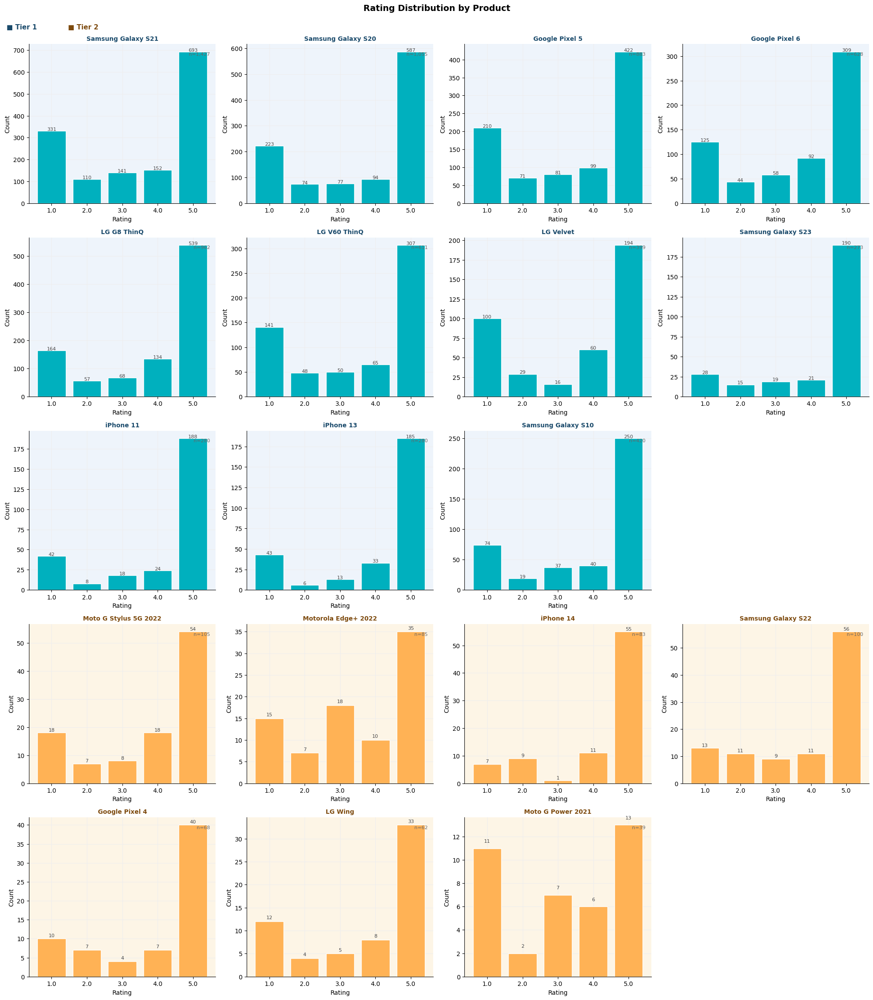

In [124]:
# Plot 1: Rating distribution per product

fig, axes = plt.subplots(NROWS, NCOLS, figsize=(20, NROWS * 4.5))
axes_flat = axes.flatten()
for ax in axes_flat:
    ax.set_visible(False)

def draw_rating_grid(products, start_slot, bg, bar_color, title_color):
    for i, product in enumerate(products):
        ax = axes_flat[start_slot + i]
        ax.set_visible(True)
        ax.set_facecolor(bg)
        subset = data[data['product'] == product]
        counts = subset['rating'].value_counts().sort_index()
        bars = ax.bar(counts.index.astype(str), counts.values,
                      color=bar_color, edgecolor='white', zorder=3)
        n = len(subset)
        ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
        ax.set_xlabel('Rating');  ax.set_ylabel('Count')
        ax.text(0.97, 0.95, f'n={n:,}', transform=ax.transAxes,
                ha='right', va='top', fontsize=8, color='#666')
        for bar, val in zip(bars, counts.values):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                    str(val), ha='center', fontsize=8, color='#444')

draw_rating_grid(TIER1, 0,        T1_BG, T1_BAR, T1_TTL)
draw_rating_grid(TIER2, T2_START, T2_BG, T2_BAR, T2_TTL)

# Tier legend
fig.text(0.01, 0.99, '■ Tier 1', fontsize=11, fontweight='bold',
         color=T1_TTL, va='top')
fig.text(0.08, 0.99, '■ Tier 2', fontsize=11, fontweight='bold',
         color=T2_TTL, va='top')
plt.suptitle('Rating Distribution by Product', fontsize=14,
             fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_ratings_by_product.png', dpi=150, bbox_inches='tight')
plt.show()

- All selected phones show the typical J curve to some degree - typical in the literature - means that there is polarized reception, very typical of hedonic products
- S20 + S21 have quite a higher amount of 1 starts -> needs extra exploration
- S22 volume is a bit too low to properly assess (n=100)

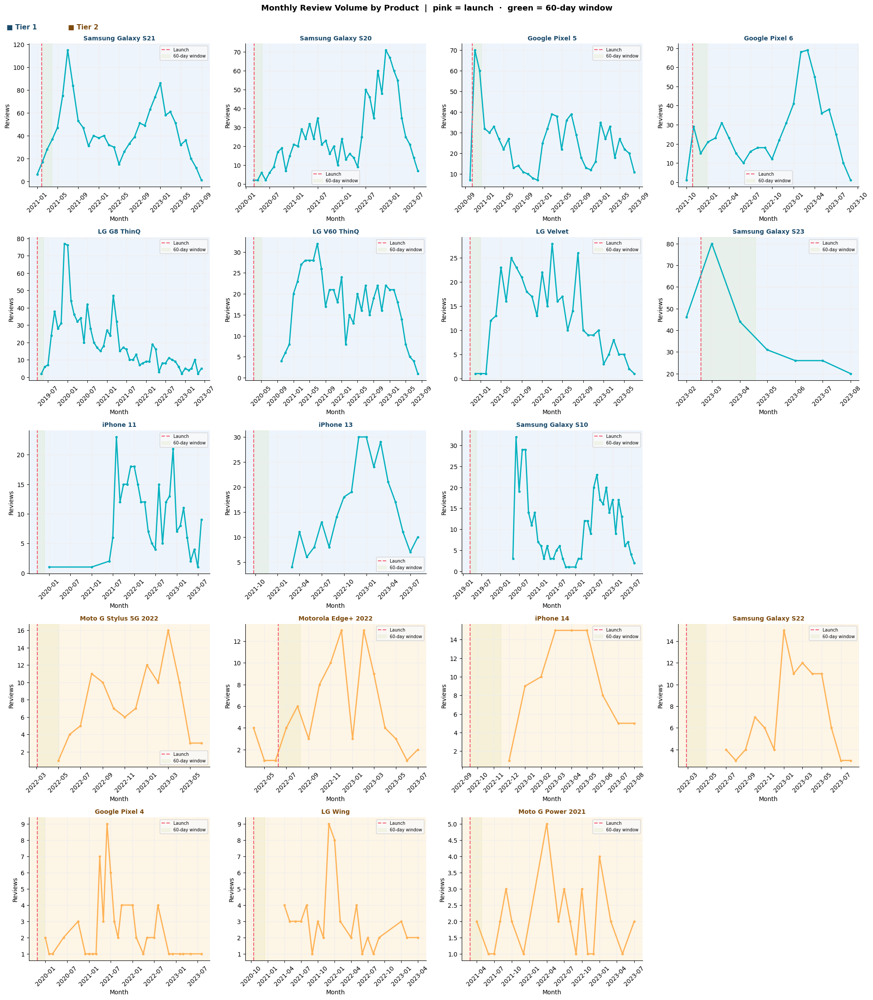

In [126]:
# Plot 2: Review volume over time per product ---
fig, axes = plt.subplots(NROWS, NCOLS, figsize=(20, NROWS * 4.5))
axes_flat = axes.flatten()
for ax in axes_flat:
    ax.set_visible(False)

def draw_volume_grid(products, start_slot, bg, line_color, title_color):
    for i, product in enumerate(products):
        ax = axes_flat[start_slot + i]
        ax.set_visible(True)
        ax.set_facecolor(bg)
        subset = data[data['product'] == product].copy()
        subset['month_year'] = pd.to_datetime(
            subset[['year', 'month']].assign(day=1))
        monthly = subset.groupby('month_year').size().reset_index(name='count')

        ax.plot(monthly['month_year'], monthly['count'],
                color=line_color, linewidth=2, marker='o', markersize=3)

        launch = pd.to_datetime(US_LAUNCH_DATES[product])  # ← changed from launch_dates
        ax.axvline(launch, color=MED_PINK, linestyle='--',
                   linewidth=1.5, label='Launch')
        ax.axvspan(launch, launch + pd.Timedelta(days=60),
                   alpha=0.08, color=MED_GREEN, zorder=1, label='60-day window')

        ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
        ax.set_xlabel('Month');  ax.set_ylabel('Reviews')
        ax.tick_params(axis='x', rotation=45)
        ax.legend(fontsize=7)

draw_volume_grid(TIER1, 0,        T1_BG, T1_BAR, T1_TTL)
draw_volume_grid(TIER2, T2_START, T2_BG, T2_BAR, T2_TTL)

fig.text(0.01, 0.99, '■ Tier 1', fontsize=11, fontweight='bold',
         color=T1_TTL, va='top')
fig.text(0.08, 0.99, '■ Tier 2', fontsize=11, fontweight='bold',
         color=T2_TTL, va='top')
plt.suptitle('Monthly Review Volume by Product  |  pink = launch  ·  green = 60-day window',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_volume_over_time.png', dpi=150, bbox_inches='tight')
plt.show()

- Here, the S23 is by far the cleanest product. It has a clear lunch spike in Feb/March 2023 and then natural decay
- S20/S21 have messy multi-peak patterns, probably driven by renewed/refurbished units being listed later
- S22 and Pixel 6 show reasonable post-launch patterns

- iPhone 13 has no lanch spike because reviews start months after launch. 

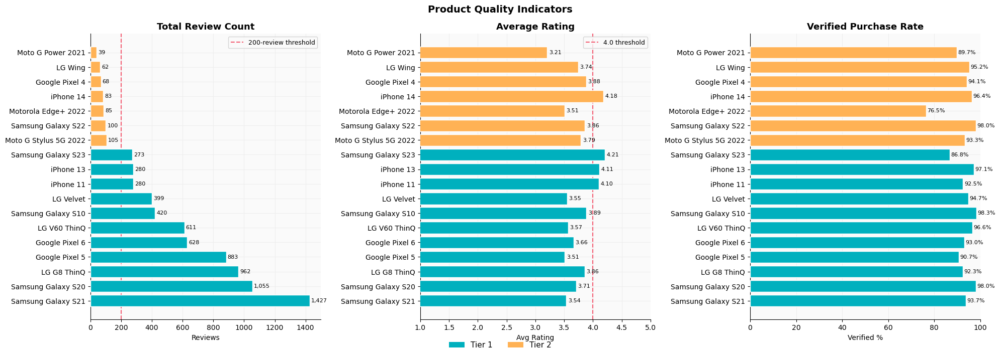

In [127]:
# Plot 3: Verified purchase rate + avg rating side by side ---
summary = (data.groupby('product')
               .agg(review_count=('rating', 'count'),
                    avg_rating=('rating', 'mean'),
                    verified_rate=('verified_purchase', 'mean'))
               .reset_index())
summary['verified_rate'] *= 100
summary['tier'] = summary['product'].map(tier_map)
# Order: T1 descending by count, then T2 descending by count
summary = pd.concat([
    summary[summary['tier'] == 1].sort_values('review_count', ascending=False),
    summary[summary['tier'] == 2].sort_values('review_count', ascending=False),
]).reset_index(drop=True)
bar_colors = [T1_BAR if t == 1 else T2_BAR for t in summary['tier']]

fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Panel 1 — Review count
bars = axes[0].barh(summary['product'], summary['review_count'],
                    color=bar_colors, edgecolor='white', zorder=3)
axes[0].axvline(200, color=MED_PINK, linestyle='--', linewidth=1.5,
                label='200-review threshold')
axes[0].set_title('Total Review Count', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Reviews')
axes[0].legend(fontsize=9)
for bar, val in zip(bars, summary['review_count']):
    axes[0].text(bar.get_width() + 10, bar.get_y() + bar.get_height()/2,
                 f'{val:,}', va='center', fontsize=8)

# Panel 2 — Avg rating
bars2 = axes[1].barh(summary['product'], summary['avg_rating'],
                     color=bar_colors, edgecolor='white', zorder=3)
axes[1].axvline(4.0, color=MED_PINK, linestyle='--', linewidth=1.5,
                label='4.0 threshold')
axes[1].set_title('Average Rating', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Avg Rating')
axes[1].set_xlim(1, 5)
axes[1].legend(fontsize=9)
for bar, val in zip(bars2, summary['avg_rating']):
    axes[1].text(bar.get_width() + 0.03, bar.get_y() + bar.get_height()/2,
                 f'{val:.2f}', va='center', fontsize=8)

# Panel 3 — Verified rate
bars3 = axes[2].barh(summary['product'], summary['verified_rate'],
                     color=bar_colors, edgecolor='white', zorder=3)
axes[2].set_title('Verified Purchase Rate', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Verified %')
axes[2].set_xlim(0, 100)
for bar, val in zip(bars3, summary['verified_rate']):
    axes[2].text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
                 f'{val:.1f}%', va='center', fontsize=8)

# Tier legend
from matplotlib.patches import Patch
legend_els = [Patch(facecolor=T1_BAR, label='Tier 1'),
              Patch(facecolor=T2_BAR, label='Tier 2')]
fig.legend(handles=legend_els, loc='lower center', ncol=2,
           fontsize=11, frameon=False, bbox_to_anchor=(0.5, -0.02))

plt.suptitle('Product Quality Indicators', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eda_quality_indicators.png', dpi=150, bbox_inches='tight')
plt.show()

- Verified purchase rates are very high (93–98%), which is a good signal quality, low fake review contamination
- Only iPhone 13, 14, 11 and S23 clear the 4.0 avg rating threshold
- Samsung S20/S21 sitting at 3.54–3.71 is likely dragged down (**probably**) by renewed unit complaints

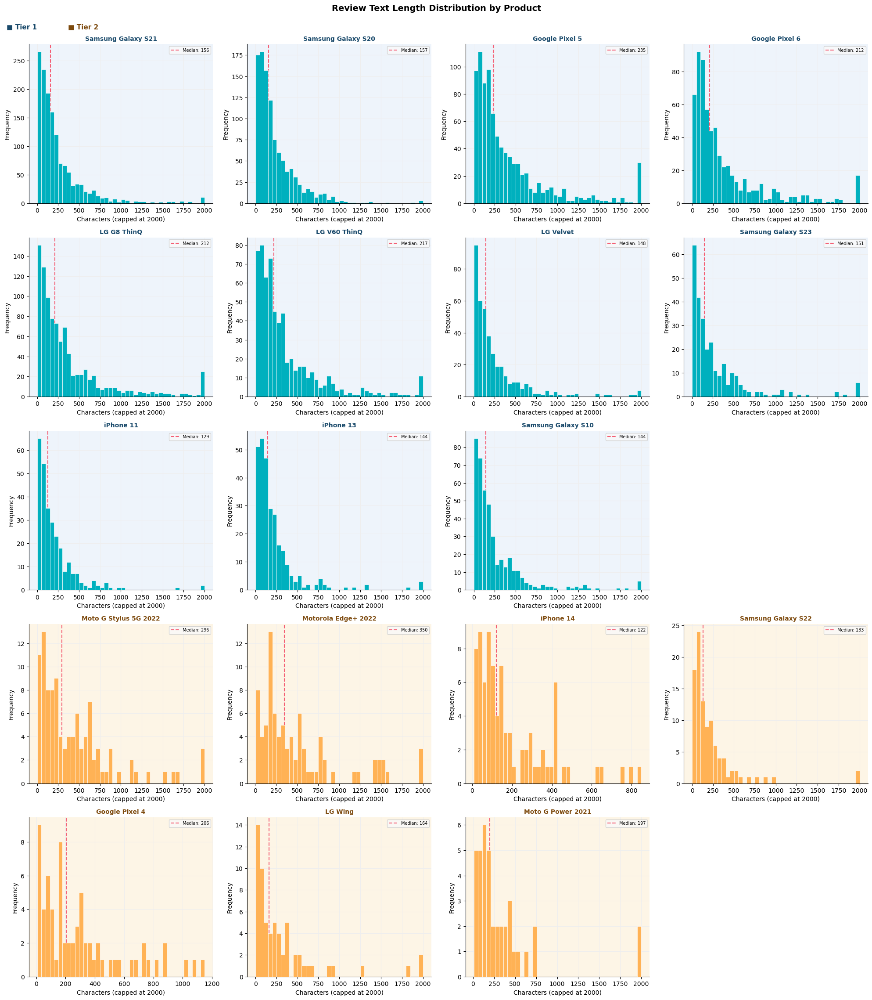

In [128]:
# Plot 4: Text length distribution per product 
fig, axes = plt.subplots(NROWS, NCOLS, figsize=(20, NROWS * 4.5))
axes_flat = axes.flatten()
for ax in axes_flat:
    ax.set_visible(False)

def draw_textlen_grid(products, start_slot, bg, bar_color, title_color):
    for i, product in enumerate(products):
        ax = axes_flat[start_slot + i]
        ax.set_visible(True)
        ax.set_facecolor(bg)
        subset = data[data['product'] == product]['text_length'].clip(upper=2000)
        median_val = subset.median()
        ax.hist(subset, bins=40, color=bar_color, edgecolor='white',
                linewidth=0.5, zorder=3)
        ax.axvline(median_val, color=MED_PINK, linestyle='--', linewidth=1.5,
                   label=f'Median: {median_val:.0f}')
        ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
        ax.set_xlabel('Characters (capped at 2000)')
        ax.set_ylabel('Frequency')
        ax.legend(fontsize=7)

draw_textlen_grid(TIER1, 0,        T1_BG, T1_BAR, T1_TTL)
draw_textlen_grid(TIER2, T2_START, T2_BG, T2_BAR, T2_TTL)

fig.text(0.01, 0.99, '■ Tier 1', fontsize=11, fontweight='bold',
         color=T1_TTL, va='top')
fig.text(0.08, 0.99, '■ Tier 2', fontsize=11, fontweight='bold',
         color=T2_TTL, va='top')
plt.suptitle('Review Text Length Distribution by Product',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_text_length.png', dpi=150, bbox_inches='tight')
plt.show()

### EDA for only 60 days window after launch

In [129]:
# Load only 60-day post-launch window per product
dfs_60 = []
for product, asins in candidate_asins_active.items():
    asin_list = ", ".join(f"'{a}'" for a in asins)
    launch = US_LAUNCH_DATES[product]
    df = conn.execute(f"""
        SELECT '{product}' as product,
               rating,
               text,
               len(text) as text_length,
               verified_purchase,
               epoch_ms(timestamp)::DATE as review_date,
               DATEDIFF('day', DATE '{launch}', epoch_ms(timestamp)::DATE) as days_since_launch
        FROM read_json_auto('{rp}')
        WHERE parent_asin IN ({asin_list})
          AND epoch_ms(timestamp)::DATE >= DATE '{launch}'
          AND epoch_ms(timestamp)::DATE <= DATE '{launch}' + INTERVAL 60 DAY
    """).df()
    dfs_60.append(df)

data_60 = pd.concat(dfs_60, ignore_index=True)
data_60['tier'] = data_60['product'].map(tier_map)

# Summary with explicit threshold check
summary_60 = (data_60.groupby('product')
              .agg(review_count=('rating', 'count'),
                   avg_rating=('rating', 'mean'),
                   verified_rate=('verified_purchase', 'mean'),
                   avg_text_length=('text_length', 'mean'))
              .round(2))
summary_60['verified_rate'] = (summary_60['verified_rate'] * 100).round(1)
summary_60['tier']   = summary_60.index.map(tier_map)
summary_60['passes'] = summary_60['review_count'] >= 200
summary_60 = summary_60.sort_values(['tier', 'review_count'], ascending=[True, False])

print("60-Day Post-Launch Window Summary")
print(f"{'Product':<26} {'T':>2} {'Reviews':>8} {'≥200':>5} {'Avg★':>6} {'Verified%':>10} {'Avg chars':>10}")
print("─" * 75)
for p, row in summary_60.iterrows():
    flag = "✓" if row['passes'] else "✗"
    print(f"{p:<26} {int(row['tier']):>2} {int(row['review_count']):>8} "
          f"{flag:>5} {row['avg_rating']:>6.2f} "
          f"{row['verified_rate']:>9.1f}% {row['avg_text_length']:>10.0f}")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

60-Day Post-Launch Window Summary
Product                     T  Reviews  ≥200   Avg★  Verified%  Avg chars
───────────────────────────────────────────────────────────────────────────
Samsung Galaxy S23          1      158     ✗   4.24      83.0%        411
Google Pixel 5              1      101     ✗   3.89      73.0%        756
Samsung Galaxy S21          1       50     ✗   3.66      68.0%        500
Google Pixel 6              1       43     ✗   3.33      60.0%        959
Samsung Galaxy S20          1        6     ✗   5.00      83.0%        179
LG Velvet                   1        1     ✗   1.00       0.0%        989
Motorola Edge+ 2022         2        8     ✗   4.50      38.0%       1140
Moto G Power 2021           2        2     ✗   5.00     100.0%        177


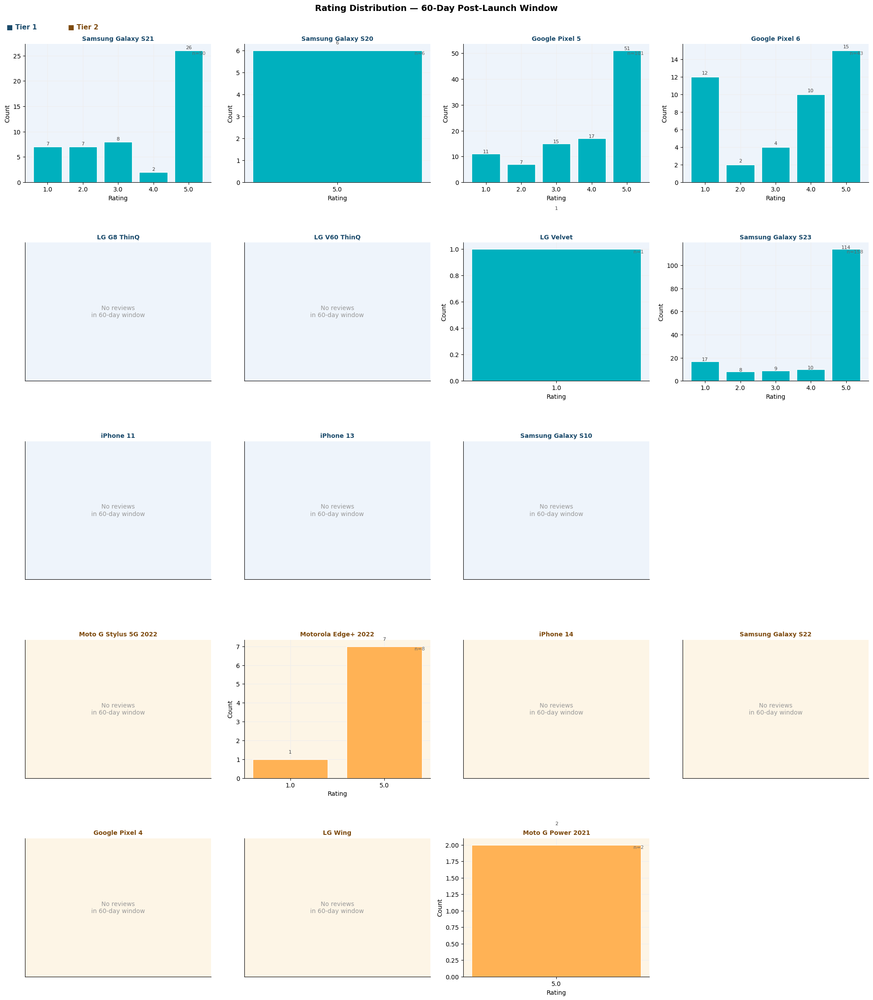

In [136]:
# Plot 1: Rating distribution in 60-day window
fig, axes = plt.subplots(NROWS, NCOLS, figsize=(20, NROWS * 4.5))
axes_flat = axes.flatten()
for ax in axes_flat:
    ax.set_visible(False)

def draw_60day_ratings(products, start_slot, bg, bar_color, title_color):
    for i, product in enumerate(products):
        ax = axes_flat[start_slot + i]
        ax.set_visible(True)
        ax.set_facecolor(bg)
        subset = data_60[data_60['product'] == product]
        n = len(subset)
        if n == 0:
            ax.set_xticks([]);  ax.set_yticks([])   # ← hides the 0.0–1.0 ticks
            ax.text(0.5, 0.5, 'No reviews\nin 60-day window',
                    ha='center', va='center', fontsize=10, color='#999',
                    transform=ax.transAxes)
            ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
            continue
        counts = subset['rating'].value_counts().sort_index()
        bars = ax.bar(counts.index.astype(str), counts.values,
                      color=bar_color, edgecolor='white', zorder=3)
        ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
        ax.set_xlabel('Rating');  ax.set_ylabel('Count')
        ax.text(0.97, 0.95, f'n={n}', transform=ax.transAxes,
                ha='right', va='top', fontsize=8, color='#666')
        for bar, val in zip(bars, counts.values):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                    str(val), ha='center', fontsize=8, color='#444')

draw_60day_ratings(TIER1, 0,        T1_BG, T1_BAR, T1_TTL)
draw_60day_ratings(TIER2, T2_START, T2_BG, T2_BAR, T2_TTL)

fig.text(0.01, 0.99, '■ Tier 1', fontsize=11, fontweight='bold', color=T1_TTL, va='top')
fig.text(0.08, 0.99, '■ Tier 2', fontsize=11, fontweight='bold', color=T2_TTL, va='top')
plt.suptitle('Rating Distribution — 60-Day Post-Launch Window',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_60day_ratings.png', dpi=150, bbox_inches='tight')
plt.show()

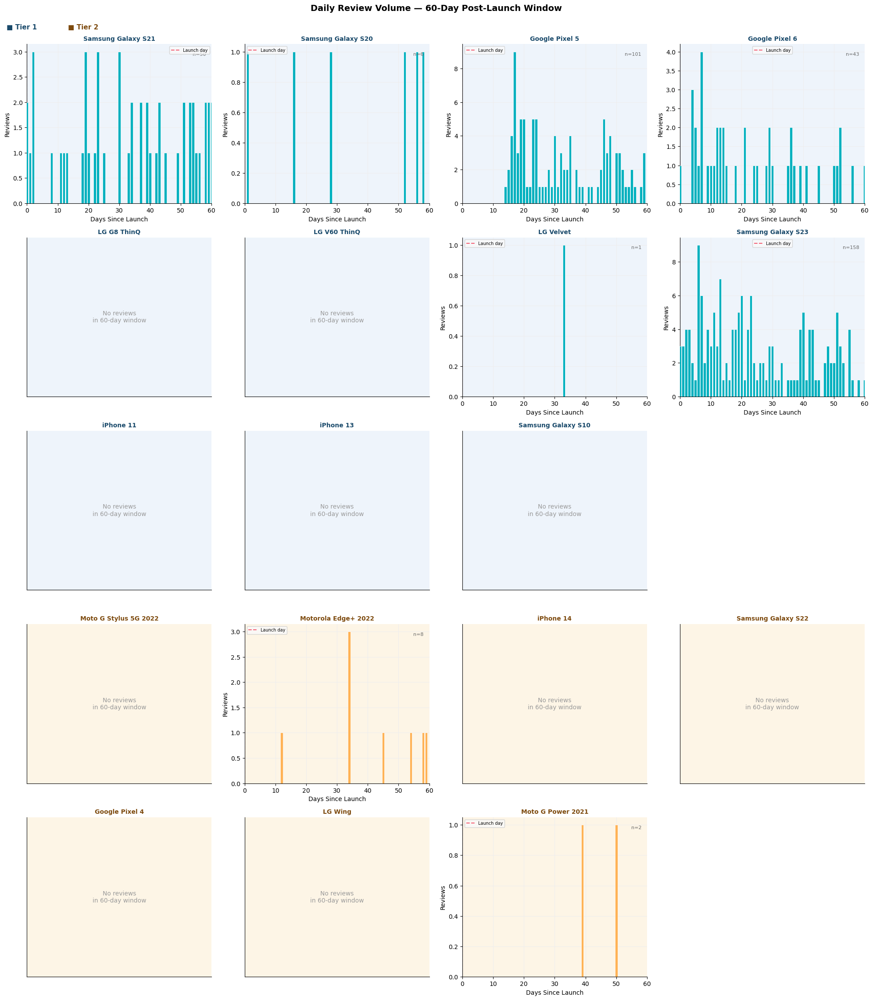

In [137]:
# Plot 2: Daily review volume in 60-day window 
fig, axes = plt.subplots(NROWS, NCOLS, figsize=(20, NROWS * 4.5))
axes_flat = axes.flatten()
for ax in axes_flat:
    ax.set_visible(False)

def draw_60day_volume(products, start_slot, bg, bar_color, title_color):
    for i, product in enumerate(products):
        ax = axes_flat[start_slot + i]
        ax.set_visible(True)
        ax.set_facecolor(bg)
        subset = data_60[data_60['product'] == product]
        n = len(subset)
        if n == 0:
            ax.set_xticks([]);  ax.set_yticks([])   # ← hides the 0.0–1.0 ticks
            ax.text(0.5, 0.5, 'No reviews\nin 60-day window',
                    ha='center', va='center', fontsize=10, color='#999',
                    transform=ax.transAxes)
            ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
            continue
        daily = subset.groupby('days_since_launch').size().reset_index(name='count')
        ax.bar(daily['days_since_launch'], daily['count'],
               color=bar_color, edgecolor='white', linewidth=0.5, zorder=3)
        ax.axvline(0, color=MED_PINK, linestyle='--', linewidth=1.5, label='Launch day')
        ax.set_title(product, fontsize=10, fontweight='bold', color=title_color)
        ax.set_xlabel('Days Since Launch');  ax.set_ylabel('Reviews')
        ax.set_xlim(0, 60)
        ax.text(0.97, 0.95, f'n={n}', transform=ax.transAxes,
                ha='right', va='top', fontsize=8, color='#666')
        ax.legend(fontsize=7)

draw_60day_volume(TIER1, 0,        T1_BG, T1_BAR, T1_TTL)
draw_60day_volume(TIER2, T2_START, T2_BG, T2_BAR, T2_TTL)

fig.text(0.01, 0.99, '■ Tier 1', fontsize=11, fontweight='bold', color=T1_TTL, va='top')
fig.text(0.08, 0.99, '■ Tier 2', fontsize=11, fontweight='bold', color=T2_TTL, va='top')
plt.suptitle('Daily Review Volume — 60-Day Post-Launch Window',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_60day_volume.png', dpi=150, bbox_inches='tight')
plt.show()

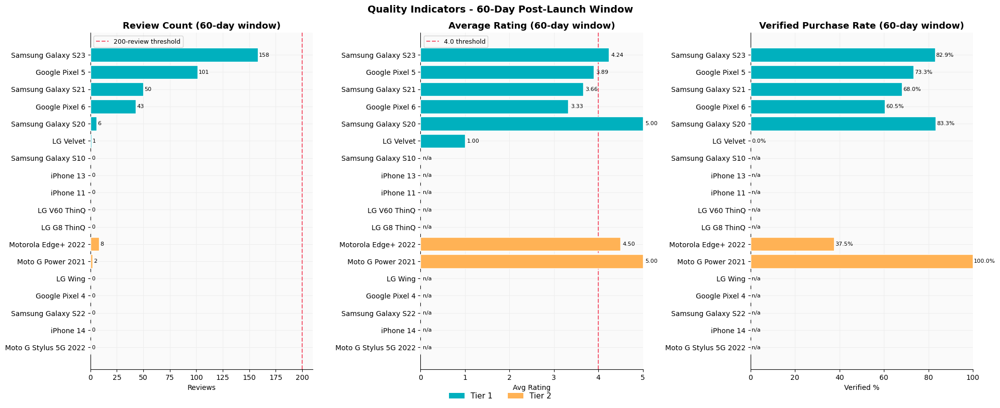

In [139]:
# Build complete summary of all 18 products, 0 for those with no reviews in window
base = pd.DataFrame({'product': active_products,
                     'tier': [tier_map[p] for p in active_products]})
in_window = (data_60.groupby('product')
             .agg(review_count=('rating', 'count'),
                  avg_rating=('rating', 'mean'),
                  verified_rate=('verified_purchase', 'mean'))
             .reset_index())
in_window['verified_rate'] *= 100

summary_plot = base.merge(in_window, on='product', how='left')
summary_plot['review_count']  = summary_plot['review_count'].fillna(0).astype(int)
summary_plot['avg_rating']    = summary_plot['avg_rating'].fillna(0)
summary_plot['verified_rate'] = summary_plot['verified_rate'].fillna(0)

# barh plots bottom→top, so put T2 first (bottom) and T1 last (top),
# ascending by count within each tier so the highest bars sit at the top
summary_plot = pd.concat([
    summary_plot[summary_plot['tier'] == 2].sort_values('review_count', ascending=True),
    summary_plot[summary_plot['tier'] == 1].sort_values('review_count', ascending=True),
]).reset_index(drop=True)
bar_colors = [T1_BAR if t == 1 else T2_BAR for t in summary_plot['tier']]

fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Panel 1 - Review count vs 200-review threshold
bars = axes[0].barh(summary_plot['product'], summary_plot['review_count'],
                    color=bar_colors, edgecolor='white', zorder=3)
axes[0].axvline(200, color=MED_PINK, linestyle='--', linewidth=1.5,
                label='200-review threshold')
axes[0].set_title('Review Count (60-day window)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Reviews')
axes[0].legend(fontsize=9)
for bar, val in zip(bars, summary_plot['review_count']):
    axes[0].text(max(bar.get_width(), 0) + 1, bar.get_y() + bar.get_height()/2,
                 str(int(val)), va='center', fontsize=8)

# Panel 2 - Avg rating (0 means no data, shown as empty bar)
bars2 = axes[1].barh(summary_plot['product'], summary_plot['avg_rating'],
                     color=bar_colors, edgecolor='white', zorder=3)
axes[1].axvline(4.0, color=MED_PINK, linestyle='--', linewidth=1.5, label='4.0 threshold')
axes[1].set_title('Average Rating (60-day window)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Avg Rating')
axes[1].set_xlim(0, 5)
axes[1].legend(fontsize=9)
for bar, val, rc in zip(bars2, summary_plot['avg_rating'], summary_plot['review_count']):
    label = f'{val:.2f}' if rc > 0 else 'n/a'
    axes[1].text(bar.get_width() + 0.05, bar.get_y() + bar.get_height()/2,
                 label, va='center', fontsize=8)

# Panel 3 - Verified rate
bars3 = axes[2].barh(summary_plot['product'], summary_plot['verified_rate'],
                     color=bar_colors, edgecolor='white', zorder=3)
axes[2].set_title('Verified Purchase Rate (60-day window)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Verified %')
axes[2].set_xlim(0, 100)
for bar, val, rc in zip(bars3, summary_plot['verified_rate'], summary_plot['review_count']):
    label = f'{val:.1f}%' if rc > 0 else 'n/a'
    axes[2].text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
                 label, va='center', fontsize=8)

from matplotlib.patches import Patch
fig.legend(handles=[Patch(facecolor=T1_BAR, label='Tier 1'),
                    Patch(facecolor=T2_BAR, label='Tier 2')],
           loc='lower center', ncol=2, fontsize=11,
           frameon=False, bbox_to_anchor=(0.5, -0.02))
plt.suptitle('Quality Indicators - 60-Day Post-Launch Window',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eda_60day_quality.png', dpi=150, bbox_inches='tight')
plt.show()

Based on this part of the EDA, all products essentially fail the 200 reviews threshold for the 60-day window. Let's see if other time windows might work.

In [133]:
# Load only 90-day post-launch window per product
dfs_90 = []
for product, asins in candidate_asins_active.items():
    asin_list = ", ".join(f"'{a}'" for a in asins)
    launch = US_LAUNCH_DATES[product]
    df = conn.execute(f"""
        SELECT '{product}' as product,
               rating,
               len(text) as text_length,
               verified_purchase,
               DATEDIFF('day', DATE '{launch}', epoch_ms(timestamp)::DATE) as days_since_launch
        FROM read_json_auto('{rp}')
        WHERE parent_asin IN ({asin_list})
          AND epoch_ms(timestamp)::DATE >= DATE '{launch}'
          AND epoch_ms(timestamp)::DATE <= DATE '{launch}' + INTERVAL 90 DAY
    """).df()
    dfs_90.append(df)

data_90 = pd.concat(dfs_90, ignore_index=True)
data_90['tier'] = data_90['product'].map(tier_map)

summary_90 = (data_90.groupby('product')
              .agg(review_count=('rating', 'count'),
                   avg_rating=('rating', 'mean'),
                   verified_rate=('verified_purchase', 'mean'))
              .round(2))
summary_90['verified_rate'] = (summary_90['verified_rate'] * 100).round(1)
summary_90['tier']   = summary_90.index.map(tier_map)
summary_90['passes'] = summary_90['review_count'] >= 200
summary_90 = summary_90.sort_values(['tier', 'review_count'], ascending=[True, False])

print("90-Day Post-Launch Window Summary")
print(f"{'Product':<26} {'T':>2} {'Reviews':>8} {'≥200':>5} {'Avg★':>6} {'Verified%':>10}")
print("─" * 60)
for p, row in summary_90.iterrows():
    flag = "✓" if row['passes'] else "✗"
    print(f"{p:<26} {int(row['tier']):>2} {int(row['review_count']):>8} "
          f"{flag:>5} {row['avg_rating']:>6.2f} {row['verified_rate']:>9.1f}%")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

90-Day Post-Launch Window Summary
Product                     T  Reviews  ≥200   Avg★  Verified%
────────────────────────────────────────────────────────────
Samsung Galaxy S23          1      191     ✗   4.19      83.0%
Google Pixel 5              1      149     ✗   3.87      77.0%
Samsung Galaxy S21          1       87     ✗   3.53      72.0%
Google Pixel 6              1       62     ✗   3.34      69.0%
Samsung Galaxy S20          1       10     ✗   4.80      90.0%
LG G8 ThinQ                 1        6     ✗   4.17      67.0%
LG Velvet                   1        2     ✗   1.00       0.0%
Motorola Edge+ 2022         2       12     ✗   4.17      58.0%
Google Pixel 4              2        2     ✗   1.50      50.0%
Moto G Power 2021           2        2     ✗   5.00     100.0%
Moto G Stylus 5G 2022       2        2     ✗   2.00     100.0%


So, even with an extended time window, more reviews need to be found from another source if the 200 days mark needs to be achieved.

# EDA laptops + tablets pre-cleaning

## Set up, ASIN search & product selection

In [143]:
mp_elec = str(meta_elec_path).replace('\\', '/')

# Step 1: aggregate reviews only — no join yet
print("Step 1: aggregating reviews (may take a few minutes)...")
counts_elec = conn.execute(f"""
    SELECT parent_asin,
           COUNT(*)                        AS n,
           ROUND(AVG(rating), 2)           AS avg_rating,
           MIN(epoch_ms(timestamp))::DATE  AS first_review,
           MAX(epoch_ms(timestamp))::DATE  AS last_review
    FROM read_json_auto('{rp_elec}')
    GROUP BY parent_asin
    HAVING COUNT(*) >= 20
""").df()
print(f"  ASINs with ≥20 reviews: {len(counts_elec):,}")

# Step 2: look up titles from meta for just those ASINs — much smaller join
print("Step 2: fetching titles from meta...")
asin_list_str = ", ".join(f"'{a}'" for a in counts_elec['parent_asin'].tolist())
meta_elec = conn.execute(f"""
    SELECT parent_asin, title
    FROM read_json_auto('{mp_elec}')
    WHERE parent_asin IN ({asin_list_str})
    QUALIFY ROW_NUMBER() OVER (PARTITION BY parent_asin ORDER BY title) = 1
""").df()
print(f"  Meta titles matched: {len(meta_elec):,}")

# Step 3: join in pandas — both dataframes are now small
top_elec = counts_elec.merge(meta_elec, on='parent_asin', how='left').sort_values('n', ascending=False).reset_index(drop=True)
print(f"\nFinal: {len(top_elec):,} ASINs")
print(top_elec.head(5).to_string(index=False))

Step 1: aggregating reviews (may take a few minutes)...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  ASINs with ≥20 reviews: 247,421
Step 2: fetching titles from meta...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Meta titles matched: 247,421

Final: 247,421 ASINs
parent_asin      n  avg_rating first_review last_review                                                                                             title
 B075X8471B 178239        4.39   2016-10-24  2023-05-28               Fire TV Stick with Alexa Voice Remote, streaming media player - Previous Generation
 B07GZFM1ZM 140751        4.51   2018-11-05  2023-08-23   Fire TV Stick 4K streaming device with Alexa Voice Remote (includes TV controls) | Dolby Vision
 B01K8B8YA8 119051        4.35   2016-10-24  2023-08-06                                      Echo Dot (2nd Generation) - Smart speaker with Alexa - White
 B010BWYDYA 103964        4.14   2007-11-19  2023-08-28 Fire Tablet with Alexa, 7" Display, 16 GB, Blue - with Special Offers (Previous Generation - 5th)
 B07H65KP63  95397        4.63   2019-07-16  2023-09-10                            Echo Dot (3rd Gen, 2018 release) - Smart speaker with Alexa - Charcoal


In [144]:
from collections import Counter

word_counts   = Counter()
first_words   = Counter()
bigram_counts = Counter()

for title in top_elec['title'].dropna():
    words = re.findall(r'\b[a-zA-Z]+\b', title.lower())
    word_counts.update(words)
    if words:
        first_words[words[0]] += 1
    bigram_counts.update(zip(words, words[1:]))

print("── Top 60 words ──────────────────────────────")
for word, count in word_counts.most_common(60):
    print(f"  {word:<22} {count:>7}")

print("\n── Top 30 first words (title openers) ────────")
for word, count in first_words.most_common(30):
    print(f"  {word:<22} {count:>7}")

print("\n── Top 30 bigrams ────────────────────────────")
for (w1, w2), count in bigram_counts.most_common(30):
    print(f"  {w1} {w2:<20} {count:>7}")

── Top 60 words ──────────────────────────────
  for                     142214
  with                    110275
  and                      54277
  case                     53132
  usb                      50634
  black                    44491
  cable                    35867
  inch                     35542
  ipad                     33056
  to                       32196
  pro                      29725
  camera                   28977
  compatible               28976
  laptop                   26945
  wireless                 25471
  adapter                  24641
  in                       23330
  cover                    22737
  bluetooth                22555
  hd                       18356
  power                    18237
  c                        18209
  pack                     17860
  mini                     17804
  stand                    17533
  tv                       17171
  screen                   15907
  charger                  15330
  hdmi                     15

In [145]:
# Words that are strong accessory signals
ACCESSORY_WORDS = {
    'case', 'cover', 'sleeve', 'charger', 'cable', 'adapter', 'hub',
    'protector', 'guard', 'skin', 'decal', 'sticker', 'stand', 'dock',
    'bag', 'pouch', 'strap', 'mount', 'holder', 'replacement', 'cord',
}

# Words that are strong device signals (specs only appear in device titles)
DEVICE_SPEC_WORDS = {
    'gb', 'tb', 'ghz', 'ram', 'ssd', 'chip', 'processor',
    'retina', 'oled', 'amoled', 'display', 'storage',
    'unlocked', 'memory', 'generation', 'core',
}

MANUFACTURER_START = re.compile(
    r'^(?:\d{4}\s+)?(?:apple|dell|microsoft|samsung|lenovo|hp|asus|acer|google)\b',
    flags=re.IGNORECASE
)
ACCESSORY_PHRASE = re.compile(
    r'\bcompatible\s+with\b|\bfor\s+(?:apple|macbook|ipad|samsung|dell|surface|iphone)\b',
    flags=re.IGNORECASE
)

def score_title(title):
    if not isinstance(title, str):
        return 'unknown', 0
    words = set(re.findall(r'\b[a-zA-Z]+\b', title.lower()))
    score = 0
    if MANUFACTURER_START.match(title):         score += 3
    score += len(words & DEVICE_SPEC_WORDS)
    score -= len(words & ACCESSORY_WORDS) * 2
    if ACCESSORY_PHRASE.search(title):          score -= 5
    return ('device' if score >= 2 else 'accessory'), score

top_elec[['label', 'score']] = top_elec['title'].apply(
    lambda t: pd.Series(score_title(t))
)

devices_elec = top_elec[top_elec['label'] == 'device'].sort_values('n', ascending=False).reset_index(drop=True)
print(f"Devices:     {len(devices_elec):>5}")
print(f"Accessories: {len(top_elec) - len(devices_elec):>5}")
print(f"Total:       {len(top_elec):>5}\n")
print(devices_elec[['parent_asin', 'title', 'n', 'avg_rating', 'first_review', 'last_review']].to_string(index=False))

Devices:     13868
Accessories: 233553
Total:       247421

parent_asin                                                                                                                                                                                                                                                                                                                                                                        title      n  avg_rating first_review last_review
 B010BWYDYA                                                                                                                                                                                                                                                                            Fire Tablet with Alexa, 7" Display, 16 GB, Blue - with Special Offers (Previous Generation - 5th) 103964        4.14   2007-11-19  2023-08-28
 B07PHQ93TV                                                                                       

In [147]:
NOTEBOOK_RE = re.compile(r'\bnotebook\b', flags=re.IGNORECASE)
MFR_RE = re.compile(
    r'^(?:\d{4}\s+)?(?:apple|dell|microsoft|samsung|lenovo|hp|asus|acer|google)\b',
    flags=re.IGNORECASE
)

notebook_rows = top_elec[
    top_elec['title'].fillna('').apply(lambda t: bool(NOTEBOOK_RE.search(t)))  &
    top_elec['title'].fillna('').apply(lambda t: bool(MFR_RE.match(t)))        &
    ~top_elec['parent_asin'].isin(devices_elec['parent_asin'])  # not already in device list
]
print(f"Additional notebook-titled rows: {len(notebook_rows)}")
print(notebook_rows[['parent_asin', 'title', 'n']].to_string(index=False))

devices_elec_expanded = pd.concat([devices_elec, notebook_rows], ignore_index=True)

# Match products against expanded device list
asin_results_elec = defaultdict(dict)

for product in all_elec_products:
    pattern = candidates_elec[product]
    matches = devices_elec_expanded[
        devices_elec_expanded['title'].fillna('').str.contains(pattern, case=False, regex=True)
    ]
    for _, row in matches.iterrows():
        asin_results_elec[product][row['parent_asin']] = row['title']

for product in all_elec_products:
    asin_dict = asin_results_elec.get(product, {})
    tag = 'LAPTOP' if product in LAPTOPS else 'TABLET'
    print(f"\n[{tag}] {product}  —  {len(asin_dict)} ASINs")
    for asin, title in asin_dict.items():
        print(f"  {asin}  |  {str(title)[:70]}")

Additional notebook-titled rows: 32
parent_asin                                                                                                                                                                                                                                                                                                                                 title   n
 B07MGTL6L9                                                                                                                                    HP 45W 19.5V 2.31A Laptop Charger for HP Notebook 15 Charger 15-ba009dx 15-ba079dx 15-ba113cl 15-bs015dx 15-bs113dx 15-bs115dx 15-bw011dx AC Adapter Power Supply Cord (4.5mm x 3mm) (SK90A195231) 544
 B00C9KUVWQ                                                                                                                                                                                                                                                                             

In [148]:
candidate_asins_elec = {
    # ── Laptops ───────────────────────────────────────────────
    'MacBook Air M1':         ['B0BRZ6VK9N', 'B08PNQTYV2', 'B08QMB94YW',
                               'B08T1NZMPN', 'B08Q78RLMB', 'B0BHNCJFRP'],
    'MacBook Air M2':         ['B0B4F9H4DF'],
    'MacBook Pro M1':         ['B08N7NV2KB', 'B08N5N6RSS', 'B08PPZMDPK', 'B08T4R9D7M'],
    'MacBook Pro M2':         ['B0BB52CWDX'],
    'Dell XPS 13 2020':       ['B09DFKQL8K', 'B09JQCTKVC'],
    'Dell XPS 13 2022':       ['B0BBGTT1R3'],   # recovered from original ASIN search
    'Surface Laptop 4':       ['B09YWN484G', 'B0BG2XRN64'],
    'Surface Laptop 5':       [],               # not found — check review threshold
    # ── Tablets ───────────────────────────────────────────────
    'iPad Pro 2021':          [],               # both matches were false positives — recheck pattern
    'iPad Pro 2022':          ['B0BJPKBT1K', 'B0BJPBFTW3'],
    'iPad Air 5':             ['B0BRQGBJ64'],
    'iPad mini 6':            ['B09HN3B9NL'],
    'Samsung Galaxy Tab S7':  ['B08H6YQZWG', 'B08L9TCGC1'],
    'Samsung Galaxy Tab S8':  [],               # not found — check review threshold
    'Surface Pro 8':          ['B09DKHYLSH', 'B09DJSF748', 'B09DK7ZWMP'],
    'Surface Pro 9':          ['B0BMB6TFYS'],
}

populated = {p: v for p, v in candidate_asins_elec.items() if v}
pending   = [p for p, v in candidate_asins_elec.items() if not v]
print(f"Populated: {len(populated)} | Pending: {len(pending)}")
if pending:
    print("  Pending:", ", ".join(pending))

Populated: 13 | Pending: 3
  Pending: Surface Laptop 5, iPad Pro 2021, Samsung Galaxy Tab S8


In [149]:
for term, product in [('surface laptop 5', 'Surface Laptop 5'),
                      ('galaxy tab s8',    'Samsung Galaxy Tab S8'),
                      ('ipad pro.*(?:m1|2021|5th)', 'iPad Pro 2021')]:
    hits = devices_elec[
        devices_elec['title'].fillna('').str.contains(term, case=False, regex=True)
    ][['parent_asin', 'title', 'n']]
    print(f"\n{product} — {len(hits)} hits in devices_elec")
    print(hits.to_string(index=False))


Surface Laptop 5 — 0 hits in devices_elec
Empty DataFrame
Columns: [parent_asin, title, n]
Index: []

Samsung Galaxy Tab S8 — 2 hits in devices_elec
parent_asin                                                                                                                                                             title   n
 B09Q4RTSLX SAMSUNG Galaxy Tab S8+ 12.4” 256GB WiFi 6E Android Tablet, Large AMOLED Screen, S Pen Included, Ultra Wide Camera, Long Lasting Battery, US Version, 2022, Silver 350
 B0B3CL6XQV                                                                                  Samsung Galaxy Tab S8 Ultra 14.6" (2022) 128GB SM-X900 WiFi - Graphite (Renewed)  21

iPad Pro 2021 — 2 hits in devices_elec
parent_asin                                                                                     title   n
 B09CDSNLL7 Apple Magic Keyboard for 12.9-Inch iPad Pro 3rd Gen / 4th Gen / 5th Gen - White (Renewed) 110
 B01D90T9HM                 Apple 9.7-Inch iPad Pro Wi-Fi, 9.7" 

In [150]:
#  Step 1: broad category classification 
LAPTOP_KW = re.compile(
    r'\b(?:macbook(?:\s+air|\s+pro)?|laptop|notebook|xps|thinkpad|'
    r'surface\s+laptop|pavilion|inspiron|elitebook|ideapad|zenbook|'
    r'vivobook|chromebook|spectre|envy|gram|swift|aspire|omen|'
    r'yoga|flex|spin|motionbook)\b',
    flags=re.IGNORECASE
)
TABLET_KW = re.compile(
    r'\b(?:ipad(?:\s+pro|\s+air|\s+mini)?|galaxy\s+tab|surface\s+pro|'
    r'tablet|kindle\s+fire|mediapad)\b',
    flags=re.IGNORECASE
)

def classify_device(title):
    if not isinstance(title, str): return 'other'
    if TABLET_KW.search(title): return 'tablet'
    if LAPTOP_KW.search(title): return 'laptop'
    return 'other'

devices_elec['category'] = devices_elec['title'].apply(classify_device)

#  Step 2: parse model family from title 
# Priority order: most specific match first
_MODEL_RULES = [
    # MacBooks — chip variant first
    (r'macbook\s+air\b.*\bm2\b',                    'MacBook Air M2'),
    (r'macbook\s+air\b.*\bm1\b',                    'MacBook Air M1'),
    (r'macbook\s+air\b',                             'MacBook Air (other)'),
    (r'macbook\s+pro\b.*\bm2\b(?!\s*pro|\s*max)',   'MacBook Pro M2'),
    (r'macbook\s+pro\b.*\bm1\b(?!\s*pro|\s*max)',   'MacBook Pro M1'),
    (r'macbook\s+pro\b.*16',                         'MacBook Pro 16"'),
    (r'macbook\s+pro\b',                             'MacBook Pro (other)'),
    # Dell XPS
    (r'dell\s+xps\s+15',                            'Dell XPS 15'),
    (r'dell\s+xps\s+13\s*(?:9315|plus)',            'Dell XPS 13 (2022)'),
    (r'dell\s+xps\s+13\s*(?:9310)',                 'Dell XPS 13 (2020)'),
    (r'dell\s+xps\s+13\b',                          'Dell XPS 13 (other)'),
    # Surface Laptop
    (r'surface\s+laptop\s+5\b',                     'Surface Laptop 5'),
    (r'surface\s+laptop\s+4\b',                     'Surface Laptop 4'),
    (r'surface\s+laptop\s+3\b',                     'Surface Laptop 3'),
    (r'surface\s+laptop\b',                         'Surface Laptop (other)'),
    # ThinkPad
    (r'thinkpad\s+x1\s+carbon',                     'ThinkPad X1 Carbon'),
    (r'thinkpad\s+x1\b',                            'ThinkPad X1 (other)'),
    (r'thinkpad\b',                                  'ThinkPad (other)'),
    # HP
    (r'hp\s+spectre\s+x360',                        'HP Spectre x360'),
    (r'hp\s+envy\b',                                'HP Envy'),
    (r'hp\s+pavilion\b',                            'HP Pavilion'),
    (r'hp\s+elitebook\b',                           'HP EliteBook'),
    # ASUS
    (r'asus\s+zenbook\b',                           'ASUS ZenBook'),
    (r'asus\s+vivobook\b',                          'ASUS VivoBook'),
    # Lenovo
    (r'lenovo\s+ideapad\b',                         'Lenovo IdeaPad'),
    (r'lenovo\s+yoga\b',                            'Lenovo Yoga'),
    # iPad
    (r'ipad\s+pro\b.*(?:m2|2022|6th)',              'iPad Pro (2022)'),
    (r'ipad\s+pro\b.*(?:m1|2021|5th)',              'iPad Pro (2021)'),
    (r'ipad\s+pro\b',                               'iPad Pro (other)'),
    (r'ipad\s+air\b.*(?:m1|2022|5th)',              'iPad Air 5'),
    (r'ipad\s+air\b',                               'iPad Air (other)'),
    (r'ipad\s+mini\b.*(?:6|2021)',                  'iPad mini 6'),
    (r'ipad\s+mini\b',                              'iPad mini (other)'),
    # Samsung Tab
    (r'galaxy\s+tab\s+s8\s*(?:ultra)',              'Galaxy Tab S8 Ultra'),
    (r'galaxy\s+tab\s+s8\s*(?:\+|plus)',            'Galaxy Tab S8+'),
    (r'galaxy\s+tab\s+s8\b',                        'Galaxy Tab S8'),
    (r'galaxy\s+tab\s+s7\s*(?:\+|plus)',            'Galaxy Tab S7+'),
    (r'galaxy\s+tab\s+s7\b',                        'Galaxy Tab S7'),
    (r'galaxy\s+tab\s+a\b',                         'Galaxy Tab A'),
    (r'galaxy\s+tab\b',                             'Galaxy Tab (other)'),
    # Surface Pro
    (r'surface\s+pro\s+9\b',                        'Surface Pro 9'),
    (r'surface\s+pro\s+8\b',                        'Surface Pro 8'),
    (r'surface\s+pro\s+7\b',                        'Surface Pro 7'),
    (r'surface\s+pro\b',                            'Surface Pro (other)'),
]
_MODEL_RULES_COMPILED = [(re.compile(p, re.IGNORECASE), label) for p, label in _MODEL_RULES]

def parse_model(title):
    if not isinstance(title, str): return 'Unknown'
    for pattern, label in _MODEL_RULES_COMPILED:
        if pattern.search(title):
            return label
    return 'Unknown'

devices_elec['model'] = devices_elec['title'].apply(parse_model)

#  Summary 
model_summary = (devices_elec
    .groupby(['category', 'model'])
    .agg(total_reviews=('n', 'sum'),
         avg_rating=('avg_rating', 'mean'),
         asin_count=('parent_asin', 'count'),
         first_review=('first_review', 'min'))
    .round(2)
    .reset_index()
    .sort_values(['category', 'total_reviews'], ascending=[True, False]))

laptops_summary = model_summary[model_summary['category'] == 'laptop']
tablets_summary = model_summary[model_summary['category'] == 'tablet']

print(f"Laptop models found: {len(laptops_summary)}")
print(laptops_summary[['model','total_reviews','avg_rating','asin_count','first_review']].to_string(index=False))
print(f"\nTablet models found: {len(tablets_summary)}")
print(tablets_summary[['model','total_reviews','avg_rating','asin_count','first_review']].to_string(index=False))

Laptop models found: 23
                 model  total_reviews  avg_rating  asin_count first_review
               Unknown         358837        3.75        3409   2003-11-18
           HP Pavilion          18140        3.82         232   2004-03-25
        Lenovo IdeaPad          11203        3.60         172   2008-11-14
               HP Envy           9470        3.72          95   2010-10-13
         ASUS VivoBook           7911        3.60          74   2012-12-30
   MacBook Air (other)           7653        4.14          59   2008-02-15
      ThinkPad (other)           7630        3.83         117   2005-10-31
   MacBook Pro (other)           6493        3.88          64   2006-03-08
          ASUS ZenBook           5942        3.65          65   2011-10-13
          HP EliteBook           4010        3.68          48   2013-02-08
       MacBook Pro 16"           3479        3.91          36   2006-06-18
           Lenovo Yoga           2009        3.36          32   2013-04-25
S

There's a lot of "unknown" model reviews - 358k to be precise. And a lot of ASINs for products. 
So, filtering approach:
1. Word frequency per product title (considering the associated ASIN) - showed per general model
2. Cutting them out

Regarding the unknown:
1. Exploration
2. Cutting

In [159]:
# Step 1 of the ASIN review audit is to look at the titles and identify which models we have strong signals for, then pull out the top words in those titles to help guide the next step of pattern matching for ASIN search. This is a bit of a manual process but should be quick and high-signal if we focus on the most popular models first.

# Generic stop words that add no signal
STOP = {
    'a','an','the','and','or','for','with','in','of','to','by','at',
    'is','it','as','on','be','this','that','from','are','was','not',
    'but','if','so','do','its','has','have','been','their','your',
    'our','all','any','can','will','also','more','than','into','about',
}

def top_words(titles, n=100):
    counter = Counter()
    for title in titles:
        if not isinstance(title, str): continue
        words = re.findall(r'\b[a-zA-Z]{3,}\b', title.lower())
        counter.update(w for w in words if w not in STOP)
    return counter.most_common(n)

# Run for all models in both categories
for category in ['laptop', 'tablet']:
    cat_data = devices_elec[devices_elec['category'] == category]
    models_in_cat = (cat_data.groupby('model')['n']
                     .sum()
                     .sort_values(ascending=False)
                     .index.tolist())

    print(f"\n{'═'*80}")
    print(f"  {category.upper()}S")
    print(f"{'═'*80}")

    for model in models_in_cat:
        subset = cat_data[cat_data['model'] == model]
        titles = subset['title'].tolist()
        total_reviews = subset['n'].sum()

        print(f"\n{'─'*80}")
        print(f"  {model}  |  {len(titles)} ASINs  |  {total_reviews:,} total reviews")
        print(f"{'─'*80}")

        # Top words
        words = top_words(titles)
        word_str = '  '.join(f"{w}({c})" for w, c in words)
        print(f"  WORDS:  {word_str}")

        # First 8 titles
        print(f"  TITLES:")
        for asin, title, n in zip(subset['parent_asin'], subset['title'], subset['n']):
            print(f"    [{n:>5} rev]  {asin}  |  {str(title)[:90]}")


════════════════════════════════════════════════════════════════════════════════
  LAPTOPS
════════════════════════════════════════════════════════════════════════════════

────────────────────────────────────────────────────────────────────────────────
  Unknown  |  3409 ASINs  |  358,837 total reviews
────────────────────────────────────────────────────────────────────────────────
  WORDS:  laptop(2659)  intel(2053)  core(1708)  windows(1573)  ram(1535)  inch(1301)  ssd(1174)  processor(753)  black(655)  hdd(654)  dell(643)  acer(595)  touchscreen(562)  asus(544)  home(528)  display(513)  hdmi(491)  wifi(475)  drive(470)  memory(461)  amd(457)  bluetooth(448)  chromebook(437)  inspiron(431)  gaming(429)  webcam(426)  celeron(418)  fhd(412)  usb(380)  full(376)  silver(376)  renewed(352)  ghz(344)  aspire(337)  geforce(332)  ips(312)  emmc(307)  notebook(305)  nvidia(303)  quad(302)  gen(294)  lenovo(289)  computer(284)  dual(280)  storage(269)  graphics(265)  dvd(256)  keyboard(247)

In [160]:
# Fix 1: Label Amazon Fire tablets in devices_elec (before re-running filter)
fire_mask = devices_elec['title'].str.contains(r'\bFire\b.*(tablet|HD|display)', 
                                                 case=False, na=False, regex=True)
devices_elec.loc[fire_mask & (devices_elec['model'] == 'Unknown'), 'model'] = 'Amazon Fire Tablet'
print(f"Amazon Fire ASINs labelled: {fire_mask.sum()}")

Amazon Fire ASINs labelled: 133


C:\Users\User\AppData\Local\Temp\ipykernel_31676\1082646331.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  fire_mask = devices_elec['title'].str.contains(r'\bFire\b.*(tablet|HD|display)',


In [179]:
# Extend model labelling — add to your existing regex assignment cell
additional_patterns = {
    'iPad (other)':            r'apple.*ipad|ipad.*(wi.fi|wifi|cellular)',
    'Nexus 7':                 r'nexus\s*7',
    'Acer Aspire':             r'acer aspire',
    'Generic Android Tablet':  r'android.*tablet|tablet.*android',
    'Dell Gaming':             r'dell.*gaming',
    'Lenovo Tab':              r'lenovo\s*tab',
    'ASUS Transformer':        r'asus\s*(tf\d|t100)',
    'Chromebook (other)':  r'chromebook|c201pa|c720|cb3-|r\s?11\s+convertible',
    'Galaxy Tab A':        r'samsung.*tab\s*a|galaxy tab a',   

}

for label, pattern in additional_patterns.items():
    mask = (devices_elec['model'] == 'Unknown') & \
           (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
    devices_elec.loc[mask, 'model'] = label
    print(f"{label:<30} {mask.sum():>4} ASINs labelled")

print(f"\nUnknown remaining: {(devices_elec['model'] == 'Unknown').sum():,}")

C:\Users\User\AppData\Local\Temp\ipykernel_31676\2236773384.py:17: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))


iPad (other)                      0 ASINs labelled
Nexus 7                           0 ASINs labelled
Acer Aspire                       0 ASINs labelled
Generic Android Tablet            0 ASINs labelled
Dell Gaming                       0 ASINs labelled
Lenovo Tab                        0 ASINs labelled
ASUS Transformer                  0 ASINs labelled


C:\Users\User\AppData\Local\Temp\ipykernel_31676\2236773384.py:17: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))


Chromebook (other)                2 ASINs labelled
Galaxy Tab A                      6 ASINs labelled

Unknown remaining: 10,673


In [180]:
# Step 2 - cutting out the ASINs that do not have keywords for devices
DEVICE_KEYWORDS = ['laptop', 'notebook', 'chromebook', 'macbook', 'tablet', 'ipad']

keyword_pattern = '|'.join(DEVICE_KEYWORDS)

print("Before / After Filter\n")

filtered_parts = []

for category, group_df in devices_elec.groupby('model'):
    before = len(group_df)
    mask = group_df['title'].str.lower().str.contains(keyword_pattern, na=False)
    filtered = group_df[mask]
    after = len(filtered)
    dropped = before - after
    print(f"{category:<30} {before:>5} ASINs → {after:>5} kept  ({dropped} dropped)")
    filtered_parts.append(filtered)

devices_elec_filtered = pd.concat(filtered_parts, ignore_index=True)

print(f"\nTotal: {len(devices_elec):,} ASINs → {len(devices_elec_filtered):,} kept  "
      f"({len(devices_elec) - len(devices_elec_filtered):,} dropped)")
print(f"\nTotal reviews retained: {devices_elec_filtered['n'].sum():,}")




Before / After Filter

ASUS Transformer                   9 ASINs →     9 kept  (0 dropped)
ASUS VivoBook                     75 ASINs →    71 kept  (4 dropped)
ASUS ZenBook                      65 ASINs →    55 kept  (10 dropped)
Acer Aspire                      328 ASINs →   187 kept  (141 dropped)
Amazon Fire Tablet               133 ASINs →    80 kept  (53 dropped)
Chromebook (other)               431 ASINs →   431 kept  (0 dropped)
Dell Gaming                       59 ASINs →    23 kept  (36 dropped)
Dell XPS 13 (2020)                 2 ASINs →     2 kept  (0 dropped)
Dell XPS 13 (other)               11 ASINs →    10 kept  (1 dropped)
Dell XPS 15                        9 ASINs →     6 kept  (3 dropped)
Galaxy Tab (other)               152 ASINs →    86 kept  (66 dropped)
Galaxy Tab A                      78 ASINs →    62 kept  (16 dropped)
Galaxy Tab S7                      3 ASINs →     1 kept  (2 dropped)
Galaxy Tab S7+                     3 ASINs →     0 kept  (3 dropped)
Gala

In [181]:
# Fix 2: Exclusion layer - remove accessories that snuck through via compatibility keywords
EXCLUDE_KEYWORDS = ['mouse', 'mice', r'\bram\b', 'memory kit', 'microsd', 
                    'micro sd', 'memory card', 'hard drive', 'keyboard', 'headset', 'earbuds', 'earphones', 'monitor', 'printer', 'scanner', 'projector',
                    'Kingston', 'Seagate', 'Western Digital', 'WD ', 'SanDisk', 'Crucial', 'Corsair', 'G.Skill', 'HyperX', 'Logitech', 'Razer', 'SteelSeries']
exclude_pattern = '|'.join(EXCLUDE_KEYWORDS)

before = len(devices_elec_filtered)
devices_elec_filtered = devices_elec_filtered[
    ~devices_elec_filtered['title'].str.lower().str.contains(exclude_pattern, na=False, regex=True)
]
after = len(devices_elec_filtered)
print(f"Accessories removed: {before - after:,} ASINs")
print(f"Reviews retained: {devices_elec_filtered['n'].sum():,}")

Accessories removed: 2,686 ASINs
Reviews retained: 781,999


In [182]:
#Now let's explore the "Unknown" category
unknown_filtered = devices_elec_filtered[devices_elec_filtered['model'] == 'Unknown'].copy()

print(f"Unknown ASINs after filter: {len(unknown_filtered):,}")
print(f"Total reviews: {unknown_filtered['n'].sum():,}\n")

# Top 50 by review count
print(" Top 50 ASINs by review count \n")
top50 = unknown_filtered.nlargest(50, 'n')[['parent_asin', 'title', 'n', 'category']]
for _, row in top50.iterrows():
    print(f"[{row['n']:>6,}]  [{row['category']}]  {row['parent_asin']}  {row['title'][:80]}")

# Word frequency on titles

all_words = []
for title in unknown_filtered['title'].dropna():
    words = re.findall(r'\b[a-z]{3,}\b', title.lower())
    all_words.extend(words)

stopwords = {'with', 'and', 'for', 'the', 'inch', 'gen', 'new', 'pro', 'air',
             'plus', 'this', 'all', 'not', 'from', 'are', 'has', 'its', 'was'}
word_freq = Counter(w for w in all_words if w not in stopwords)

print("\n Top 40 words in Unknown titles \n")
for word, count in word_freq.most_common(40):
    print(f"  {word:<20} {count}")

Unknown ASINs after filter: 1,236
Total reviews: 112,163

 Top 50 ASINs by review count 

[ 1,677]  [tablet]  B00G3788AS  Dell Venue 8 Pro 5000 Series 32 GB Windows 8.1 Tablet
[ 1,422]  [tablet]  B009LGLEFY  Asus Transformer Pad Infinity TF700T-B1-GR 10.1-Inch 32GB Tablet (Amethyst Gray)
[ 1,411]  [other]  B08Y6QCLJP  SAMSUNG 980 SSD 1TB PCle 3.0x4, NVMe M.2 2280, Internal Solid State Drive, Stora
[ 1,213]  [laptop]  B08C4K4SMW  SAMSUNG 870 QVO SATA III SSD 2TB 2.5" Internal Solid State Drive, Upgrade Deskto
[ 1,131]  [tablet]  B0142T6LWU  ASUS ZenPad S8 8" (2048x1536) 32GB Black Tablet - Z580C-B1-BK
[ 1,102]  [laptop]  B001PS9UKW  Kingston Technology 8GB Kit (2x4 GB Modules) 1066MHz DDR3 SODIMM Notebook Memory
[ 1,090]  [tablet]  B00OJCD41C  Google Nexus 9 0P82100-16-BLK 8.9-Inch, 16 GB Flash Memory Tablet (Black)
[   970]  [tablet]  B00NNQDY74  ASUS MeMO Pad 7 ME70CX 7-Inch 16GB Tablet
[   958]  [tablet]  B00NSHLVD2  HP Stream 7 32GB Windows 8.1 Tablet (Includes Office 365 Personal f

It looks like there's a lot of unprocessed models and some accessories still slip through. Strategy:
1. Using the "category" column that is already in the Dataframe. If 

In [183]:

print(devices_elec_filtered[devices_elec_filtered['model'] == 'Unknown']['category'].value_counts())

category
laptop    1000
tablet     214
other       22
Name: count, dtype: int64


In [184]:
# Fix 3: Drop 'other' category + positional keyword filter on Unknown bucket
before = len(devices_elec_filtered)

# Option 1: drop category == 'other'
devices_elec_filtered = devices_elec_filtered[devices_elec_filtered['category'] != 'other']

# Option 2: for Unknown bucket, require device keyword in first 40 chars
unknown_mask = devices_elec_filtered['model'] == 'Unknown'
position_ok = devices_elec_filtered['title'].str[:40].str.lower().str.contains(keyword_pattern, na=False)

# Keep all non-Unknown rows + Unknown rows that pass positional check
devices_elec_filtered = devices_elec_filtered[~unknown_mask | position_ok]

after = len(devices_elec_filtered)
print(f"Dropped: {before - after:,} ASINs")
print(f"Remaining: {after:,} ASINs")
print(f"Reviews retained: {devices_elec_filtered['n'].sum():,}")

# Spot-check remaining Unknown
unknown_remaining = devices_elec_filtered[devices_elec_filtered['model'] == 'Unknown']
print(f"\nUnknown bucket: {len(unknown_remaining):,} ASINs")
print("\nTop 50 remaining Unknown titles:")
for _, row in unknown_remaining.nlargest(50, 'n').iterrows():
    print(f"  [{row['n']:>6,}]  {row['title'][:80]}")


Dropped: 658 ASINs
Remaining: 1,911 ASINs
Reviews retained: 720,267

Unknown bucket: 582 ASINs

Top 50 remaining Unknown titles:
  [   958]  HP Stream 7 32GB Windows 8.1 Tablet (Includes Office 365 Personal for One Year)
  [   933]  ASUS MeMOPad HD 7-Inch 16 GB Tablet, White (ME173X-A1-WH)
  [   847]  HP TouchPad Wi-Fi 32 GB 9.7-Inch Tablet Computer
  [   818]  Acer Predator Helios 300 Gaming Laptop PC, 15.6" FHD IPS w/ 144Hz Refresh, Intel
  [   755]  Dell D620 Laptop Duo Core with Windows XP
  [   734]  SGIN Laptop 15.6 Inch, 4GB DDR4 128GB SSD Windows 11 Laptops with Intel Celeron 
  [   724]  HP Notebook 15-ay011nr 15.6-Inch Laptop (6th Gen Intel Core i5-6200U Processor, 
  [   639]  Acer Swift 3 Thin & Light Laptop, 14" Full HD IPS, AMD Ryzen 7 4700U Octa-Core w
  [   570]  Lenovo Laptop Backpack B210, 15.6-Inch Laptop/Tablet, Durable, Water-Repellent, 
  [   517]  HP Stream 7 Tablet 32 GB Windows 8.1 Signature Edition, Black
  [   501]  Apple A1181 Macbook MB403LL 13.3 Inch Lapto

## EDA on electronics reviews

In [194]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np

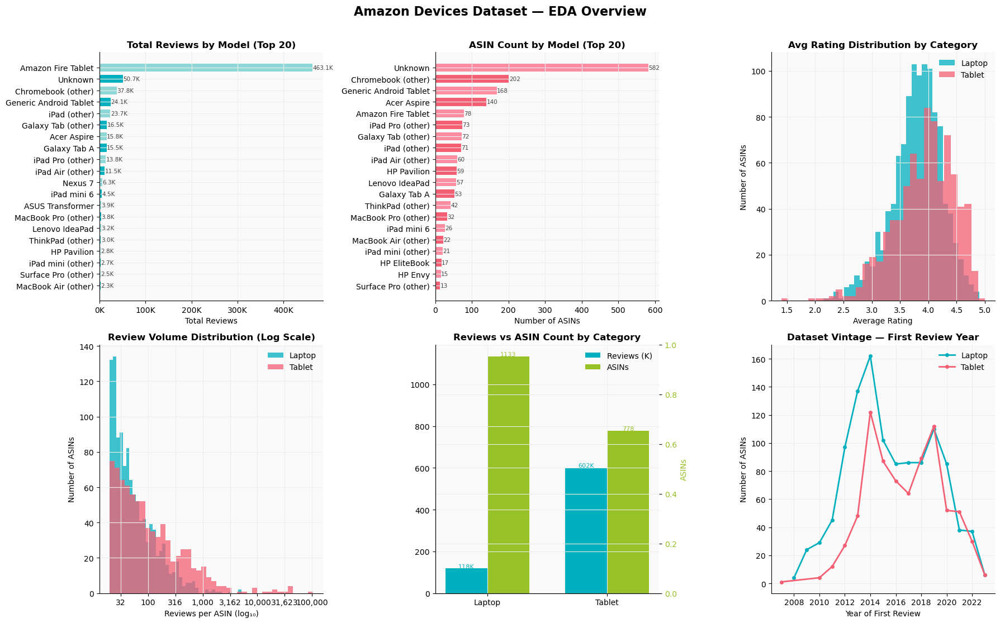

Saved: eda_devices_overview.png


In [196]:
import matplotlib.ticker as mticker

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle('Amazon Devices Dataset — EDA Overview', fontsize=16, fontweight='bold', y=1.01)

# ── 1. Total reviews by model (top 20, horizontal bar) ───────────────────────
ax = axes[0, 0]
top_models = (devices_elec_filtered
              .groupby('model')['n'].sum()
              .sort_values(ascending=True)
              .tail(20))
colors = [MED_BLUE if i % 2 == 0 else LIGHT_BLUE for i in range(len(top_models))]
bars = ax.barh(top_models.index, top_models.values, color=colors, edgecolor='none', height=0.7)
ax.set_xlabel('Total Reviews')
ax.set_title('Total Reviews by Model (Top 20)', fontweight='bold')
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x/1e3:.0f}K'))
for bar, val in zip(bars, top_models.values):
    ax.text(val + 500, bar.get_y() + bar.get_height()/2,
            f'{val/1e3:.1f}K', va='center', fontsize=7.5, color='#444')

# ── 2. ASIN count by model (top 20) ──────────────────────────────────────────
ax = axes[0, 1]
top_asin = (devices_elec_filtered
            .groupby('model')['parent_asin'].count()
            .sort_values(ascending=True)
            .tail(20))
colors2 = [MED_PINK if i % 2 == 0 else LIGHT_PINK for i in range(len(top_asin))]
bars2 = ax.barh(top_asin.index, top_asin.values, color=colors2, edgecolor='none', height=0.7)
ax.set_xlabel('Number of ASINs')
ax.set_title('ASIN Count by Model (Top 20)', fontweight='bold')
for bar, val in zip(bars2, top_asin.values):
    ax.text(val + 0.3, bar.get_y() + bar.get_height()/2,
            str(val), va='center', fontsize=7.5, color='#444')

# ── 3. Avg rating distribution by category ───────────────────────────────────
ax = axes[0, 2]
for i, (cat, grp) in enumerate(devices_elec_filtered.groupby('category')):
    ax.hist(grp['avg_rating'], bins=30, alpha=0.75,
            color=PALETTE[i], edgecolor='none', label=cat.capitalize())
ax.set_xlabel('Average Rating')
ax.set_ylabel('Number of ASINs')
ax.set_title('Avg Rating Distribution by Category', fontweight='bold')
ax.legend(frameon=False)

# ── 4. Reviews per ASIN distribution (log scale) ─────────────────────────────
ax = axes[1, 0]
for i, (cat, grp) in enumerate(devices_elec_filtered.groupby('category')):
    ax.hist(np.log10(grp['n'].clip(lower=1)), bins=40, alpha=0.75,
            color=PALETTE[i], edgecolor='none', label=cat.capitalize())
ax.set_xlabel('Reviews per ASIN (log₁₀)')
ax.set_ylabel('Number of ASINs')
ax.set_title('Review Volume Distribution (Log Scale)', fontweight='bold')
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{10**x:,.0f}'))
ax.legend(frameon=False)

# ── 5. Laptop vs tablet share (reviews + ASINs) ──────────────────────────────
ax = axes[1, 1]
summary = devices_elec_filtered.groupby('category').agg(
    reviews=('n', 'sum'), asins=('parent_asin', 'count')).reset_index()
x = np.arange(len(summary))
w = 0.35
b1 = ax.bar(x - w/2, summary['reviews'] / 1e3, width=w,
            color=MED_BLUE, edgecolor='none', label='Reviews (K)')
b2 = ax.bar(x + w/2, summary['asins'], width=w,
            color=MED_GREEN, edgecolor='none', label='ASINs')
ax.set_xticks(x)
ax.set_xticklabels([c.capitalize() for c in summary['category']])
ax.set_title('Reviews vs ASIN Count by Category', fontweight='bold')
ax.legend(frameon=False)
ax2 = ax.twinx()
ax2.set_ylabel('ASINs', color=MED_GREEN)
ax2.tick_params(axis='y', labelcolor=MED_GREEN)
ax2.spines['top'].set_visible(False)
for bar, val in zip(b1, summary['reviews']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
            f'{val/1e3:.0f}K', ha='center', fontsize=8, color=MED_BLUE)
for bar, val in zip(b2, summary['asins']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
            str(val), ha='center', fontsize=8, color=MED_GREEN)

# ── 6. First review year distribution (data vintage) ─────────────────────────
ax = axes[1, 2]
devices_elec_filtered['first_year'] = pd.to_datetime(
    devices_elec_filtered['first_review'], errors='coerce').dt.year
for i, (cat, grp) in enumerate(devices_elec_filtered.groupby('category')):
    counts = grp['first_year'].value_counts().sort_index()
    ax.plot(counts.index, counts.values, marker='o', markersize=4,
            color=PALETTE[i], linewidth=2, label=cat.capitalize())
ax.set_xlabel('Year of First Review')
ax.set_ylabel('Number of ASINs')
ax.set_title('Dataset Vintage — First Review Year', fontweight='bold')
ax.legend(frameon=False)
ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))

plt.tight_layout()
plt.savefig('eda_devices_overview.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: eda_devices_overview.png")


In [208]:
# ── Inspect ambiguous model buckets ──────────────────────────────────────────
ambiguous = [
    'MacBook Air (other)', 'MacBook Pro (other)', 'Surface Pro (other)',
    'Surface Laptop (other)', 'iPad Pro (other)', 'iPad Air (other)',
    'iPad mini (other)', 'Galaxy Tab A', 'Galaxy Tab (other)',
    'ThinkPad (other)', 'ThinkPad X1 (other)', 'Dell XPS 13 (other)',
    'Dell XPS 15', 'HP Pavilion', 'HP Envy', 'HP EliteBook',
    'HP Spectre x360', 'Lenovo IdeaPad', 'Lenovo Yoga',
    'ASUS VivoBook', 'ASUS ZenBook', 'Chromebook (other)', 'Amazon Fire Tablet'
]

for bucket in ambiguous:
    grp = devices_elec_filtered[devices_elec_filtered['model'] == bucket]
    if len(grp) == 0:
        continue
    print(f"\n{'='*70}")
    print(f"  {bucket}  ({len(grp)} ASINs, {grp['n'].sum():,} reviews)")
    print(f"{'='*70}")
    for _, row in grp.nlargest(30, 'n').iterrows():
        print(f"  [{row['n']:>6,}]  {row['title'][:85]}")


  MacBook Air (other)  (22 ASINs, 2,307 reviews)
  [   393]  Apple MacBook Air MD760LL/A Intel Core i5-4250U X2 1.3GHz 8GB 128GB SSD 13.3in, Silve
  [   261]  Apple MacBook Air MD231ll/A 13-Inch Laptop
  [   180]  Apple MacBook Air 13.3-Inch Laptop MD760LL/B, 1.4 GHz Intel i5 Dual Core Processor (R
  [   151]  Apple MacBook Air (13-inch Retina display, 1.6GHz dual-core Intel Core i5, 128GB) - S
  [   148]  Apple MacBook Air MD760LL/A Intel Core i5-4250U X2 1.3GHz 4GB 256GB SSD 13.3in, Silve
  [   146]  Apple 13.3 inches MacBook Air Retina display, 1.6GHz dual-core Intel Core i5, 256GB -
  [   129]  Apple MacBook Air 13.3in LED Laptop Intel i5-5250U Dual Core 1.6GHz 4GB 128GB SSD Ear
  [   122]  Apple MacBook Air (13-inch Retina Display, 1.6GHz Dual-Core Intel Core i5, 128GB) - G
  [   103]  Apple MacBook Air MJVG2LL/A 13.3-Inch Laptop (256 GB) OLD VERSION
  [    97]  Apple MMGG2LL/A MacBook Air 13.3-Inch Laptop, 256 GB (Discontinued by Manufacturer)
  [    95]  Apple Macbook Air Super

There's too many devices placed together in the same buckets. So, they need splitting

In [209]:
# ── Sub-split viable buckets ──────────────────────────────────────────────────
# Run on devices_elec (before filtering) then rebuild devices_elec_filtered

sub_splits = {

    # ── Amazon Fire Tablet ────────────────────────────────────────────────────
    'Fire 7 (2019)':       (r'fire\s*7.*(2019|7th|previous gen)', 'Amazon Fire Tablet'),
    'Fire HD 8 (2020)':    (r'fire\s*hd\s*8.*(2020|plus)', 'Amazon Fire Tablet'),
    'Fire HD 8 (other)':   (r'fire\s*hd\s*8', 'Amazon Fire Tablet'),
    'Fire HD 10 (2019)':   (r'fire\s*hd\s*10.*(2019|1080)', 'Amazon Fire Tablet'),
    'Fire HD 10 (other)':  (r'fire\s*hd\s*10', 'Amazon Fire Tablet'),
    'Fire HDX 8.9':        (r'fire\s*hdx', 'Amazon Fire Tablet'),

    # ── iPad Pro ──────────────────────────────────────────────────────────────
    'iPad Pro 2021':       (r'2021.*ipad pro|ipad pro.*(5th gen)', 'iPad Pro (other)'),
    'iPad Pro 2020':       (r'2020.*ipad pro|ipad pro.*(4th|2nd gen.*11)', 'iPad Pro (other)'),
    'iPad Pro 2018':       (r'2018.*ipad pro|ipad pro.*(1st gen.*11|3rd gen.*12)', 'iPad Pro (other)'),
    'iPad Pro 2017':       (r'ipad pro.*(10\.5|2017)', 'iPad Pro (other)'),
    'iPad Pro 2016':       (r'ipad pro.*(9\.7)', 'iPad Pro (other)'),

    # ── iPad Air ─────────────────────────────────────────────────────────────
    'iPad Air 4 (2020)':   (r'2020.*ipad air|ipad air.*(4th gen|10\.9)', 'iPad Air (other)'),
    'iPad Air 3 (2019)':   (r'ipad air.*(3rd gen|10\.5)', 'iPad Air (other)'),
    'iPad Air 2 (2014)':   (r'ipad air\s*2', 'iPad Air (other)'),

    # ── iPad mini ────────────────────────────────────────────────────────────
    'iPad mini 4 (2015)':  (r'ipad mini\s*4', 'iPad mini (other)'),
    'iPad mini 3 (2014)':  (r'ipad mini\s*3', 'iPad mini (other)'),

    # ── Surface Pro ──────────────────────────────────────────────────────────
    'Surface Pro 3 (2014)': (r'surface pro\s*3', 'Surface Pro (other)'),
    'Surface Pro 5 (2017)': (r'surface pro\s*5', 'Surface Pro (other)'),
}

# Apply in order — first match wins, so more specific patterns go first
for new_label, (pattern, source_bucket) in sub_splits.items():
    mask = (
        (devices_elec['model'] == source_bucket) &
        (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
    )
    devices_elec.loc[mask, 'model'] = new_label
    print(f"{new_label:<30} {mask.sum():>4} ASINs labelled")

print(f"\nRemaining in Amazon Fire Tablet: "
      f"{(devices_elec['model'] == 'Amazon Fire Tablet').sum()}")
print(f"Remaining in iPad Pro (other):   "
      f"{(devices_elec['model'] == 'iPad Pro (other)').sum()}")
print(f"Remaining in iPad Air (other):   "
      f"{(devices_elec['model'] == 'iPad Air (other)').sum()}")
print(f"Remaining in iPad mini (other):  "
      f"{(devices_elec['model'] == 'iPad mini (other)').sum()}")
print(f"Remaining in Surface Pro (other):"
      f"{(devices_elec['model'] == 'Surface Pro (other)').sum()}")

C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups.

Fire 7 (2019)                     8 ASINs labelled
Fire HD 8 (2020)                  7 ASINs labelled
Fire HD 8 (other)                30 ASINs labelled
Fire HD 10 (2019)                10 ASINs labelled
Fire HD 10 (other)               16 ASINs labelled
Fire HDX 8.9                     36 ASINs labelled
iPad Pro 2021                     3 ASINs labelled
iPad Pro 2020                     6 ASINs labelled
iPad Pro 2018                     1 ASINs labelled
iPad Pro 2017                    29 ASINs labelled
iPad Pro 2016                    19 ASINs labelled
iPad Air 4 (2020)                 2 ASINs labelled
iPad Air 3 (2019)                 0 ASINs labelled


C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  (devices_elec['title'].str.contains(pattern, case=False, na=False, regex=True))
C:\Users\User\AppData\Local\Temp\ipykernel_31676\1979536380.py:39: UserWarning: This pattern is interpreted as a regular expression, and has match groups.

iPad Air 2 (2014)                45 ASINs labelled
iPad mini 4 (2015)               15 ASINs labelled
iPad mini 3 (2014)                2 ASINs labelled
Surface Pro 3 (2014)             14 ASINs labelled
Surface Pro 5 (2017)              2 ASINs labelled

Remaining in Amazon Fire Tablet: 26
Remaining in iPad Pro (other):   24
Remaining in iPad Air (other):   15
Remaining in iPad mini (other):  4
Remaining in Surface Pro (other):42


In [210]:
# ── Rebuild devices_elec_filtered after sub-splits ───────────────────────────
keyword_pattern = '|'.join(DEVICE_KEYWORDS)
before = len(devices_elec)

# Step 2: title keyword whitelist
mask_kw = devices_elec['title'].str.lower().str.contains(keyword_pattern, na=False)

# Step 3: drop category == 'other'
mask_cat = devices_elec['category'] != 'other'

# Step 4: positional filter on Unknown only
unknown_mask = devices_elec['model'] == 'Unknown'
position_ok = devices_elec['title'].str[:40].str.lower().str.contains(keyword_pattern, na=False)

devices_elec_filtered = devices_elec[
    mask_kw & mask_cat & (~unknown_mask | position_ok)
].copy()

print(f"Rebuilt: {len(devices_elec_filtered):,} ASINs, "
      f"{devices_elec_filtered['n'].sum():,} reviews")
print()

# Summary of new sub-split buckets
new_buckets = [
    'Fire 7 (2019)', 'Fire HD 8 (2020)', 'Fire HD 8 (other)',
    'Fire HD 10 (2019)', 'Fire HD 10 (other)', 'Fire HDX 8.9',
    'iPad Pro 2021', 'iPad Pro 2020', 'iPad Pro 2018', 'iPad Pro 2017', 'iPad Pro 2016',
    'iPad Air 4 (2020)', 'iPad Air 3 (2019)', 'iPad Air 2 (2014)',
    'iPad mini 4 (2015)', 'iPad mini 3 (2014)',
    'Surface Pro 3 (2014)', 'Surface Pro 5 (2017)',
]

print("=== New bucket review counts ===\n")
for bucket in new_buckets:
    grp = devices_elec_filtered[devices_elec_filtered['model'] == bucket]
    if len(grp) > 0:
        print(f"  {bucket:<30} {len(grp):>4} ASINs   {grp['n'].sum():>8,} reviews")

Rebuilt: 3,890 ASINs, 912,475 reviews

=== New bucket review counts ===

  Fire 7 (2019)                     8 ASINs     84,036 reviews
  Fire HD 8 (2020)                  7 ASINs     36,390 reviews
  Fire HD 8 (other)                14 ASINs    118,188 reviews
  Fire HD 10 (2019)                10 ASINs     88,748 reviews
  Fire HD 10 (other)               16 ASINs     15,050 reviews
  Fire HDX 8.9                     13 ASINs      5,195 reviews
  iPad Pro 2021                     3 ASINs      1,179 reviews
  iPad Pro 2020                     6 ASINs      1,666 reviews
  iPad Pro 2018                     1 ASINs        703 reviews
  iPad Pro 2017                    29 ASINs      2,250 reviews
  iPad Pro 2016                    19 ASINs      3,093 reviews
  iPad Air 4 (2020)                 2 ASINs      1,145 reviews
  iPad Air 2 (2014)                45 ASINs      8,256 reviews
  iPad mini 4 (2015)               15 ASINs      2,303 reviews
  iPad mini 3 (2014)                2 ASINs  

In [211]:
US_LAUNCH_DATES_ELECTRONICS = {

    # ── Amazon Fire Tablets ───────────────────────────────────────────────────
    'Fire 7 (2019)':         '2019-05-29',
    'Fire HD 8 (2020)':      '2020-09-30',
    'Fire HD 10 (2019)':     '2019-10-30',

    # ── iPad Pro ──────────────────────────────────────────────────────────────
    'iPad Pro 2016':         '2016-03-31',   # 9.7-inch
    'iPad Pro 2017':         '2017-06-05',   # 10.5-inch
    'iPad Pro 2018':         '2018-11-07',   # 11-inch 1st gen
    'iPad Pro 2020':         '2020-03-25',
    'iPad Pro 2021':         '2021-04-30',
    'iPad Pro (2021)':       '2021-04-30',   # already-named bucket
    'iPad Pro (2022)':       '2022-10-26',

    # ── iPad Air ─────────────────────────────────────────────────────────────
    'iPad Air 2 (2014)':     '2014-10-16',
    'iPad Air 3 (2019)':     '2019-03-18',
    'iPad Air 4 (2020)':     '2020-10-23',
    'iPad Air 5':            '2022-03-18',   # already-named bucket

    # ── iPad mini ────────────────────────────────────────────────────────────
    'iPad mini 4 (2015)':    '2015-09-09',
    'iPad mini 6':           '2021-09-24',   # already-named bucket

    # ── Surface Pro ──────────────────────────────────────────────────────────
    'Surface Pro 3 (2014)':  '2014-06-20',
    'Surface Pro 7':         '2019-10-22',   # already-named bucket
    'Surface Pro 8':         '2021-10-05',   # already-named bucket
    'Surface Pro 9':         '2022-10-12',   # already-named bucket

    # ── MacBook Air ──────────────────────────────────────────────────────────
    'MacBook Air M1':        '2020-11-17',
    'MacBook Air M2':        '2022-06-10',

    # ── MacBook Pro ──────────────────────────────────────────────────────────
    'MacBook Pro M1':        '2021-10-18',
    'MacBook Pro M2':        '2023-01-17',
    'MacBook Pro 16"':       '2021-10-18',

    # ── Galaxy Tab ───────────────────────────────────────────────────────────
    'Galaxy Tab S7':         '2020-08-21',
    'Galaxy Tab S7+':        '2020-08-21',
    'Galaxy Tab S8+':        '2022-02-25',
    'Galaxy Tab S8 Ultra':   '2022-02-25',

    # ── Dell XPS ─────────────────────────────────────────────────────────────
    'Dell XPS 13 (2020)':    '2020-01-06',
}

# Quick viability check against actual bucket review counts
print("=== Launch date viability check ===\n")
print(f"{'Model':<30} {'Launch':<14} {'ASINs':>6} {'Reviews':>10}  Status")
print("-" * 75)

for model, date in US_LAUNCH_DATES_ELECTRONICS.items():
    grp = devices_elec_filtered[devices_elec_filtered['model'] == model]
    asins = len(grp)
    reviews = grp['n'].sum()
    status = '✓' if reviews >= 5000 else ('~' if reviews >= 1000 else '✗ low')
    if asins > 0:
        print(f"{model:<30} {date:<14} {asins:>6} {reviews:>10,}  {status}")

=== Launch date viability check ===

Model                          Launch          ASINs    Reviews  Status
---------------------------------------------------------------------------
Fire 7 (2019)                  2019-05-29          8     84,036  ✓
Fire HD 8 (2020)               2020-09-30          7     36,390  ✓
Fire HD 10 (2019)              2019-10-30         10     88,748  ✓
iPad Pro 2016                  2016-03-31         19      3,093  ~
iPad Pro 2017                  2017-06-05         29      2,250  ~
iPad Pro 2018                  2018-11-07          1        703  ✗ low
iPad Pro 2020                  2020-03-25          6      1,666  ~
iPad Pro 2021                  2021-04-30          3      1,179  ~
iPad Pro (2021)                2021-04-30          2        151  ✗ low
iPad Pro (2022)                2022-10-26          2        250  ✗ low
iPad Air 2 (2014)              2014-10-16         45      8,256  ✓
iPad Air 4 (2020)              2020-10-23          2      1,145  ~

The Status (if a device is appropriate for the thesis) is set based on reviews having 
1. >= 5k -> ✓
2. between 1k and 5k -> ~
3. Under 1k -> ✗

This is just an indicator for the moment, NOT A METHODOLOGICAL STEP.

In [212]:
import os
data_dir = Path(r"C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Electronics\Electronics.jsonl")
fp = str(data_dir).replace('\\', '/')

data_dir = Path(r"C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Electronics\Electronics.jsonl")

size_bytes = os.path.getsize(data_dir)
print(f"File size: {size_bytes / 1e9:.2f} GB")

# Count rows - takes ~1 min on large files
with open(data_dir, 'rb') as f:
    row_count = sum(1 for _ in f)
print(f"Total rows: {row_count:,}")

File size: 22.62 GB
Total rows: 43,886,944


In [214]:
import json

reviews_file = r"C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews\Electronics\Electronics.jsonl"

print("=== First 3 rows ===\n")
with open(reviews_file, 'r', encoding='utf-8') as f:
    for i, line in enumerate(f):
        row = json.loads(line)
        print(f"--- Row {i+1} ---")
        for k, v in row.items():
            print(f"  {k}: {str(v)[:80]}")
        print()
        if i >= 2:
            break

=== First 3 rows ===

--- Row 1 ---
  rating: 3.0
  title: Smells like gasoline! Going back!
  text: First & most offensive: they reek of gasoline so if you are sensitive/allergic t
  images: [{'small_image_url': 'https://m.media-amazon.com/images/I/71YN+Qk3kCL._SL256_.jp
  asin: B083NRGZMM
  parent_asin: B083NRGZMM
  user_id: AFKZENTNBQ7A7V7UXW5JJI6UGRYQ
  timestamp: 1658185117948
  helpful_vote: 0
  verified_purchase: True

--- Row 2 ---
  rating: 1.0
  title: Didn’t work at all lenses loose/broken.
  text: These didn’t work. Idk if they were damaged in shipping or what, but the lenses 
  images: []
  asin: B07N69T6TM
  parent_asin: B07N69T6TM
  user_id: AFKZENTNBQ7A7V7UXW5JJI6UGRYQ
  timestamp: 1592678549731
  helpful_vote: 0
  verified_purchase: True

--- Row 3 ---
  rating: 5.0
  title: Excellent!
  text: I love these. They even come with a carry case and several sizes of ear bud inse
  images: []
  asin: B01G8JO5F2
  parent_asin: B01G8JO5F2
  user_id: AFKZENTNBQ7A7V7UXW5JJI6UGRYQ

3 dataframes:
1. reviews_all - every review for every device ASIN, for general EDA
2. reviews_60d - only post-launch 60-day window, for the thesis analysis
3. reviews_90d - same products but with a 90-day window



In [215]:
import json
import pandas as pd
from datetime import timedelta
from tqdm import tqdm

# ── Build lookup structures ───────────────────────────────────────────────────
# Set of ASINs we care about
valid_asins = set(devices_elec_filtered['parent_asin'])

# Map parent_asin → (model, launch_date) for windowed filtering
asin_to_model = devices_elec_filtered.set_index('parent_asin')['model'].to_dict()

model_to_launch = {
    model: pd.Timestamp(date)
    for model, date in US_LAUNCH_DATES_ELECTRONICS.items()
}

# Map each ASIN to its launch date via model
asin_to_launch = {
    asin: model_to_launch[model]
    for asin, model in asin_to_model.items()
    if model in model_to_launch
}

print(f"ASINs with launch dates: {len(asin_to_launch):,}")
print(f"ASINs without launch dates (kept for general EDA): "
      f"{len(valid_asins) - len(asin_to_launch):,}")

# ── Chunked loader ────────────────────────────────────────────────────────────
CHUNK_SIZE = 500_000
FIELDS = ['rating', 'text', 'asin', 'parent_asin', 'timestamp',
          'helpful_vote', 'verified_purchase']

rows_all   = []   # all reviews for valid ASINs (general EDA)
rows_60d   = []   # reviews within 60-day post-launch window

total_read = 0
total_kept_all = 0
total_kept_60d = 0

with open(reviews_file, 'r', encoding='utf-8') as f:
    chunk = []
    for line in tqdm(f, total=43_886_944, desc="Loading reviews", unit="rows"):
        row = json.loads(line)
        if row.get('parent_asin') not in valid_asins:
            total_read += 1
            continue

        # Parse timestamp (milliseconds → datetime)
        ts = pd.Timestamp(row['timestamp'], unit='ms')
        rec = {
            'rating':             row.get('rating'),
            'text':               row.get('text', ''),
            'asin':               row.get('asin'),
            'parent_asin':        row.get('parent_asin'),
            'timestamp':          ts,
            'helpful_vote':       row.get('helpful_vote', 0),
            'verified_purchase':  row.get('verified_purchase', False),
        }
        chunk.append(rec)
        total_read += 1

        if len(chunk) >= CHUNK_SIZE:
            df_chunk = pd.DataFrame(chunk)

            # All valid device reviews
            rows_all.append(df_chunk)
            total_kept_all += len(df_chunk)

            # 60-day window filter
            launch_dates = df_chunk['parent_asin'].map(asin_to_launch)
            mask_60d = (
                launch_dates.notna() &
                (df_chunk['timestamp'] >= launch_dates) &
                (df_chunk['timestamp'] <= launch_dates + timedelta(days=60))
            )
            rows_60d.append(df_chunk[mask_60d])
            total_kept_60d += mask_60d.sum()

            chunk = []

    # Process final chunk
    if chunk:
        df_chunk = pd.DataFrame(chunk)
        rows_all.append(df_chunk)
        total_kept_all += len(df_chunk)

        launch_dates = df_chunk['parent_asin'].map(asin_to_launch)
        mask_60d = (
            launch_dates.notna() &
            (df_chunk['timestamp'] >= launch_dates) &
            (df_chunk['timestamp'] <= launch_dates + timedelta(days=60))
        )
        rows_60d.append(df_chunk[mask_60d])
        total_kept_60d += mask_60d.sum()

# ── Assemble final DataFrames ─────────────────────────────────────────────────
reviews_all = pd.concat(rows_all, ignore_index=True)
reviews_60d = pd.concat(rows_60d, ignore_index=True)

# Add model label
reviews_all['model'] = reviews_all['parent_asin'].map(asin_to_model)
reviews_60d['model'] = reviews_60d['parent_asin'].map(asin_to_model)

print(f"\n{'='*50}")
print(f"Total rows scanned:          {total_read:>12,}")
print(f"All device reviews kept:     {len(reviews_all):>12,}")
print(f"60-day window reviews kept:  {len(reviews_60d):>12,}")
print(f"\nreviews_all shape:  {reviews_all.shape}")
print(f"reviews_60d shape:  {reviews_60d.shape}")

# ── 60-day counts per model ───────────────────────────────────────────────────
print(f"\n=== 60-day review counts per model ===\n")
summary = (reviews_60d.groupby('model')
           .agg(reviews=('rating', 'count'),
                avg_rating=('rating', 'mean'),
                pct_verified=('verified_purchase', 'mean'))
           .sort_values('reviews', ascending=False))
summary['avg_rating'] = summary['avg_rating'].round(2)
summary['pct_verified'] = (summary['pct_verified'] * 100).round(1)
print(summary.to_string())

ASINs with launch dates: 244
ASINs without launch dates (kept for general EDA): 3,646


Loading reviews: 100%|██████████| 43886944/43886944 [05:38<00:00, 129715.34rows/s]



Total rows scanned:            43,886,944
All device reviews kept:          912,475
60-day window reviews kept:        12,750

reviews_all shape:  (912475, 8)
reviews_60d shape:  (12750, 8)

=== 60-day review counts per model ===

                      reviews  avg_rating  pct_verified
model                                                  
Fire HD 10 (2019)        4752        4.22          97.6
Fire HD 8 (2020)         4078        4.29          97.8
Fire 7 (2019)            2890        4.05          97.0
iPad Pro 2020             171        4.43          88.3
Surface Pro 3 (2014)      122        4.43          27.9
iPad mini 6               117        3.98          83.8
MacBook Pro 16"           111        3.95          80.2
MacBook Air M1             95        4.48          77.9
iPad Air 5                 80        4.53          90.0
iPad Pro 2021              69        4.42          78.3
iPad Air 2 (2014)          63        4.25          61.9
iPad Pro (2022)            62        3.9

In [216]:
# ── 90-day post-launch window ─────────────────────────────────────────────────
launch_dates_90 = reviews_all['parent_asin'].map(asin_to_launch)

mask_90d = (
    launch_dates_90.notna() &
    (reviews_all['timestamp'] >= launch_dates_90) &
    (reviews_all['timestamp'] <= launch_dates_90 + timedelta(days=90))
)

reviews_90d = reviews_all[mask_90d].copy()

print(f"reviews_90d shape: {reviews_90d.shape}")
print(f"\n=== 90-day review counts per model ===\n")

summary_90 = (reviews_90d.groupby('model')
              .agg(reviews=('rating', 'count'),
                   avg_rating=('rating', 'mean'),
                   pct_verified=('verified_purchase', 'mean'))
              .sort_values('reviews', ascending=False))
summary_90['avg_rating'] = summary_90['avg_rating'].round(2)
summary_90['pct_verified'] = (summary_90['pct_verified'] * 100).round(1)

# Side-by-side comparison with 60-day
print(f"{'Model':<25} {'60d':>7} {'90d':>7}  {'Δ':>6}  {'Avg★':>6}  {'%Verified':>10}")
print("-" * 70)

for model in summary_90.index:
    r90 = summary_90.loc[model, 'reviews']
    r60 = summary.loc[model, 'reviews'] if model in summary.index else 0
    avg = summary_90.loc[model, 'avg_rating']
    pct = summary_90.loc[model, 'pct_verified']
    flag = '✓' if r90 >= 200 else ('~' if r90 >= 100 else '✗')
    print(f"{model:<25} {r60:>7,} {r90:>7,}  {r90-r60:>+6,}  {avg:>6.2f}  {pct:>9.1f}%  {flag}")

reviews_90d shape: (23386, 8)

=== 90-day review counts per model ===

Model                         60d     90d       Δ    Avg★   %Verified
----------------------------------------------------------------------
Fire HD 10 (2019)           4,752  10,916  +6,164    4.37       98.3%  ✓
Fire HD 8 (2020)            4,078   5,714  +1,636    4.29       97.6%  ✓
Fire 7 (2019)               2,890   4,873  +1,983    4.07       96.0%  ✓
iPad Pro 2020                 171     267     +96    4.45       90.3%  ✓
iPad Air 2 (2014)              63     263    +200    4.63       85.6%  ✓
MacBook Air M1                 95     180     +85    4.47       83.3%  ~
iPad mini 6                   117     179     +62    3.97       87.2%  ~
Surface Pro 3 (2014)          122     172     +50    4.42       30.2%  ~
MacBook Pro 16"               111     164     +53    4.06       84.8%  ~
iPad Pro 2021                  69     134     +65    4.49       84.3%  ~
iPad Air 5                     80     129     +49    4.53 

Based on the outputs from above, we see the following models that can be used:
1. Fire HD 10 (2019) - both time windowws - tablet - Utilitarian
2. Fire HD 8 (2020) - both time windows - tablet - utilitarian
3. Fire 7 (2019) - both time windows - tablet - utilitarian
4. iPad Pro 2020 - 90d - tablet - hedonic
5. iPad Air 2 (2014) - 90d - tablet - hedonic
6. MacBook Air M1 - 90d - Laptop - hedonic
7. iPad mini 6 - 90d - tablet - hedonic
8. MacBook Pro 16" - 90d - laptop - hedonic

Because of the low nr of reviews for hedonic, the time window needs to be increased to 90 days

We drop:
1. Surface Pro 3 - 30.2% verified purchases is too low, introduces authenticity noise
2. iPad Pro 2021 (134) and iPad Air 5 (129) - on the edge but you already have 8 solid events; keeping them risks diluting quality over quantity
3. Everything ✗ - insufficient regardless of window

Note for self: flag in the thesis - the hedonic side is iPad/MacBook heavy - all Apple. That's fine methodologically since product type is the moderator, not brand, but worth one sentence of acknowledgment in the methodology

For the H/U aspect:
- The Fire tablets act as utilitarian, so there is a substantial anchor on that side
- The Apple products are more hedonic, and are needed for the moderator to work

Now we look at the final df for thesis

In [221]:
# ── Final thesis events ───────────────────────────────────────────────────────
THESIS_EVENTS = {
    # Utilitarian — 60-day window
    'Fire HD 10 (2019)': {'launch': '2019-10-30', 'window': 90, 'type': 'utilitarian'},
    'Fire HD 8 (2020)':  {'launch': '2020-09-30', 'window': 90, 'type': 'utilitarian'},
    'Fire 7 (2019)':     {'launch': '2019-05-29', 'window': 90, 'type': 'utilitarian'},
    # Hedonic — 90-day window
    'iPad Pro 2020':     {'launch': '2020-03-25', 'window': 90, 'type': 'hedonic'},
    'iPad Air 2 (2014)': {'launch': '2014-10-16', 'window': 90, 'type': 'hedonic'},
    'MacBook Air M1':    {'launch': '2020-11-17', 'window': 90, 'type': 'hedonic'},
    'iPad mini 6':       {'launch': '2021-09-24', 'window': 90, 'type': 'hedonic'},
    'MacBook Pro 16"':   {'launch': '2021-10-18', 'window': 90, 'type': 'hedonic'},
}

# ── Filter reviews to thesis events ──────────────────────────────────────────
thesis_models = set(THESIS_EVENTS.keys())

def apply_event_window(df):
    """Keep only rows belonging to thesis events and within their window."""
    rows = []
    for model, meta in THESIS_EVENTS.items():
        launch = pd.Timestamp(meta['launch'])
        window = meta['window']
        subset = df[df['model'] == model].copy()
        subset = subset[
            (subset['timestamp'] >= launch) &
            (subset['timestamp'] <= launch + timedelta(days=window))
        ]
        subset['product_type'] = meta['type']
        subset['launch_date']  = launch
        subset['window_days']  = window
        subset['days_since_launch'] = (subset['timestamp'] - launch).dt.days
        rows.append(subset)
    return pd.concat(rows, ignore_index=True)

reviews_thesis = apply_event_window(reviews_all)

print(f"reviews_thesis shape: {reviews_thesis.shape}")
print(f"\nFinal event summary\n")
print(f"{'Model':<25} {'Type':<14} {'Window':>7} {'Reviews':>9} {'Avg stars':>7} {'%Verified':>11}")
print("-" * 78)

for model, meta in THESIS_EVENTS.items():
    grp = reviews_thesis[reviews_thesis['model'] == model]
    avg  = grp['rating'].mean()
    pctv = grp['verified_purchase'].mean() * 100
    print(f"{model:<25} {meta['type']:<14} {meta['window']:>5}d  "
          f"{len(grp):>9,}  {avg:>6.2f}  {pctv:>9.1f}%")

print(f"\n{'─'*78}")
print(f"{'TOTAL':<25} {'3 util / 5 hedonic':<14} {'':>7} "
      f"{len(reviews_thesis):>9,}")

# Distribution check
print(f"\nBy product type\n")
for ptype in ['utilitarian', 'hedonic']:
    grp = reviews_thesis[reviews_thesis['product_type'] == ptype]
    print(f"  {ptype:<14} {len(grp):>7,} reviews  "
          f"avg stars {grp['rating'].mean():.2f}  "
          f"verified {grp['verified_purchase'].mean()*100:.1f}%")

reviews_thesis shape: (22556, 12)

Final event summary

Model                     Type            Window   Reviews Avg stars   %Verified
------------------------------------------------------------------------------
Fire HD 10 (2019)         utilitarian       90d     10,916    4.37       98.3%
Fire HD 8 (2020)          utilitarian       90d      5,714    4.29       97.6%
Fire 7 (2019)             utilitarian       90d      4,873    4.07       96.0%
iPad Pro 2020             hedonic           90d        267    4.45       90.3%
iPad Air 2 (2014)         hedonic           90d        263    4.63       85.6%
MacBook Air M1            hedonic           90d        180    4.47       83.3%
iPad mini 6               hedonic           90d        179    3.97       87.2%
MacBook Pro 16"           hedonic           90d        164    4.06       84.8%

──────────────────────────────────────────────────────────────────────────────
TOTAL                     3 util / 5 hedonic            22,556

By produ

The split is severely imbalanced.
This will affect the moderator analysis -> mention in the limitations and interpretation of H3a/H3b results

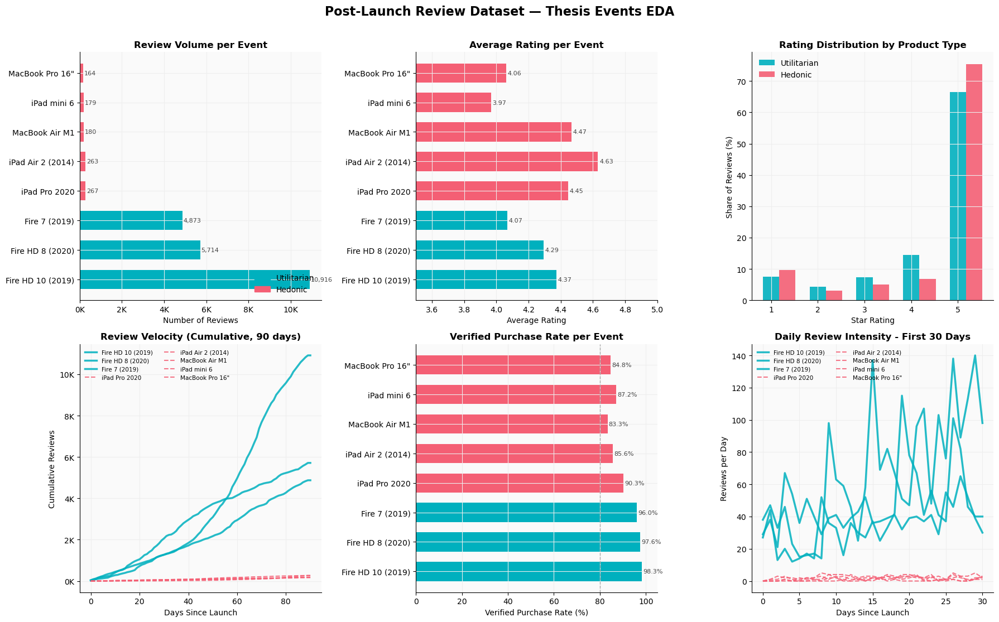

Saved: eda_thesis_events_electronics.png


In [223]:
fig, axes = plt.subplots(2, 3, figsize=(18, 11))
fig.suptitle('Post-Launch Review Dataset — Thesis Events EDA', 
             fontsize=16, fontweight='bold', y=1.01)

MODEL_ORDER = [
    'Fire HD 10 (2019)', 'Fire HD 8 (2020)', 'Fire 7 (2019)',
    'iPad Pro 2020', 'iPad Air 2 (2014)', 'MacBook Air M1',
    'iPad mini 6', 'MacBook Pro 16"'
]
TYPE_COLORS = {'utilitarian': MED_BLUE, 'hedonic': MED_PINK}
model_colors = [TYPE_COLORS[THESIS_EVENTS[m]['type']] for m in MODEL_ORDER]

# ── 1. Review volume per event (horizontal bar) ───────────────────────────────
ax = axes[0, 0]
counts = [len(reviews_thesis[reviews_thesis['model'] == m]) for m in MODEL_ORDER]
bars = ax.barh(MODEL_ORDER, counts, color=model_colors, edgecolor='none', height=0.65)
ax.set_xlabel('Number of Reviews')
ax.set_title('Review Volume per Event', fontweight='bold')
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x/1e3:.0f}K'))
for bar, val in zip(bars, counts):
    ax.text(val + 50, bar.get_y() + bar.get_height()/2,
            f'{val:,}', va='center', fontsize=8, color='#444')
# Legend
from matplotlib.patches import Patch
ax.legend(handles=[Patch(color=MED_BLUE, label='Utilitarian'),
                   Patch(color=MED_PINK, label='Hedonic')],
          frameon=False, loc='lower right')

# ── 2. Average rating per event ───────────────────────────────────────────────
ax = axes[0, 1]
avg_ratings = [reviews_thesis[reviews_thesis['model'] == m]['rating'].mean() 
               for m in MODEL_ORDER]
bars2 = ax.barh(MODEL_ORDER, avg_ratings, color=model_colors, edgecolor='none', height=0.65)
ax.set_xlabel('Average Rating')
ax.set_title('Average Rating per Event', fontweight='bold')
ax.set_xlim(3.5, 5.0)
for bar, val in zip(bars2, avg_ratings):
    ax.text(val + 0.01, bar.get_y() + bar.get_height()/2,
            f'{val:.2f}', va='center', fontsize=8, color='#444')

# ── 3. Rating distribution by product type ───────────────────────────────────
ax = axes[0, 2]
for i, (ptype, color) in enumerate(TYPE_COLORS.items()):
    grp = reviews_thesis[reviews_thesis['product_type'] == ptype]
    counts_r = grp['rating'].value_counts().sort_index()
    pct = counts_r / counts_r.sum() * 100
    ax.bar([r + i*0.35 for r in pct.index], pct.values,
           width=0.35, color=color, edgecolor='none', 
           alpha=0.9, label=ptype.capitalize())
ax.set_xlabel('Star Rating')
ax.set_ylabel('Share of Reviews (%)')
ax.set_title('Rating Distribution by Product Type', fontweight='bold')
ax.set_xticks([1, 2, 3, 4, 5])
ax.legend(frameon=False)

# ── 4. Review velocity — cumulative reviews over 90 days ─────────────────────
ax = axes[1, 0]
for model, color in zip(MODEL_ORDER, model_colors):
    grp = reviews_thesis[reviews_thesis['model'] == model].copy()
    daily = grp.groupby('days_since_launch').size()
    cumulative = daily.reindex(range(91), fill_value=0).cumsum()
    lw = 2.5 if THESIS_EVENTS[model]['type'] == 'utilitarian' else 1.5
    ls = '-' if THESIS_EVENTS[model]['type'] == 'utilitarian' else '--'
    ax.plot(cumulative.index, cumulative.values,
            color=color, linewidth=lw, linestyle=ls,
            label=model, alpha=0.85)
ax.set_xlabel('Days Since Launch')
ax.set_ylabel('Cumulative Reviews')
ax.set_title('Review Velocity (Cumulative, 90 days)', fontweight='bold')
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x/1e3:.0f}K'))
ax.legend(frameon=False, fontsize=7.5, ncol=2)

# ── 5. Verified purchase rate per event ───────────────────────────────────────
ax = axes[1, 1]
vpct = [reviews_thesis[reviews_thesis['model'] == m]['verified_purchase'].mean() * 100
        for m in MODEL_ORDER]
bars3 = ax.barh(MODEL_ORDER, vpct, color=model_colors, edgecolor='none', height=0.65)
ax.axvline(80, color='#aaa', linewidth=1, linestyle='--')
ax.set_xlabel('Verified Purchase Rate (%)')
ax.set_title('Verified Purchase Rate per Event', fontweight='bold')
ax.set_xlim(0, 105)
for bar, val in zip(bars3, vpct):
    ax.text(val + 0.5, bar.get_y() + bar.get_height()/2,
            f'{val:.1f}%', va='center', fontsize=8, color='#444')

# ── 6. Daily review rate — first 30 days (launch intensity) ──────────────────
ax = axes[1, 2]
for model, color in zip(MODEL_ORDER, model_colors):
    grp = reviews_thesis[reviews_thesis['model'] == model]
    daily = (grp[grp['days_since_launch'] <= 30]
             .groupby('days_since_launch').size()
             .reindex(range(31), fill_value=0))
    lw = 2.5 if THESIS_EVENTS[model]['type'] == 'utilitarian' else 1.5
    ls = '-' if THESIS_EVENTS[model]['type'] == 'utilitarian' else '--'
    ax.plot(daily.index, daily.values,
            color=color, linewidth=lw, linestyle=ls,
            label=model, alpha=0.85)
ax.set_xlabel('Days Since Launch')
ax.set_ylabel('Reviews per Day')
ax.set_title('Daily Review Intensity - First 30 Days', fontweight='bold')
ax.legend(frameon=False, fontsize=7.5, ncol=2)

plt.tight_layout()
plt.savefig('eda_thesis_events_electronics.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: eda_thesis_events_electronics.png")

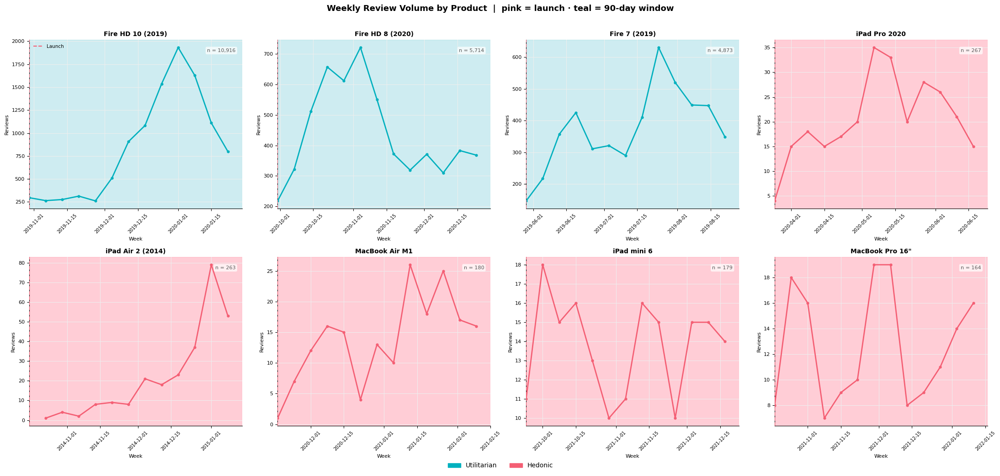

Saved: review_volume_per_event.png


In [233]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# ── Layout: 2 rows × 4 cols for 8 events ─────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(22, 10))
fig.suptitle('Weekly Review Volume by Product  |  pink = launch · teal = 90-day window',
             fontsize=13, fontweight='bold', y=1.01)

axes_flat = axes.flatten()

for idx, (model, meta) in enumerate(THESIS_EVENTS.items()):
    ax = axes_flat[idx]
    ptype = meta['type']
    launch = pd.Timestamp(meta['launch'])
    window_end = launch + pd.Timedelta(days=90)
    color = MED_BLUE if ptype == 'utilitarian' else MED_PINK

    # ── Get reviews for this model, clipped to 90-day window ─────────────────
    grp = reviews_thesis[reviews_thesis['model'] == model].copy()
    grp = grp[(grp['timestamp'] >= launch) & (grp['timestamp'] <= window_end)]

    # ── Weekly buckets anchored to launch date ────────────────────────────────
    grp['week'] = ((grp['timestamp'] - launch).dt.days // 7)
    weekly = grp.groupby('week').size().reset_index(name='reviews')
    weekly['week_ts'] = launch + pd.to_timedelta(weekly['week'] * 7, unit='D')

    # ── Background shading ────────────────────────────────────────────────────
    ax.set_facecolor('#f0f8ff' if ptype == 'utilitarian' else '#fff0f3')
    ax.axvspan(launch, window_end,
               color=LIGHT_BLUE if ptype == 'utilitarian' else LIGHT_PINK,
               alpha=0.35, zorder=0)

    # ── Plot line ─────────────────────────────────────────────────────────────
    ax.plot(weekly['week_ts'], weekly['reviews'],
            color=color, linewidth=2, marker='o', markersize=3.5, zorder=3)

    # ── Clip x-axis to exactly the 90-day window ─────────────────────────────
    ax.set_xlim(launch, window_end)

    # ── Launch line ───────────────────────────────────────────────────────────
    ax.axvline(launch, color=MED_PINK, linewidth=1.5,
               linestyle='--', zorder=4, label='Launch')

    # ── Titles & labels ───────────────────────────────────────────────────────
    ax.set_title(f'{model}', fontweight='bold', fontsize=10, pad=6)
    ax.set_xlabel('Week', fontsize=8)
    ax.set_ylabel('Reviews', fontsize=8)
    ax.tick_params(axis='x', labelsize=7, rotation=45)
    ax.tick_params(axis='y', labelsize=8)

    # ── Spines ────────────────────────────────────────────────────────────────
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # ── Annotation: reviews within the 90-day window ──────────────────────────
    ax.annotate(f'n = {len(grp):,}', xy=(0.97, 0.95), xycoords='axes fraction',
                ha='right', va='top', fontsize=8, color='#555',
                bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7, ec='none'))

    # ── Legend (first plot only) ──────────────────────────────────────────────
    if idx == 0:
        ax.legend(fontsize=7.5, frameon=False, loc='upper left')

# ── Global legend for product type ───────────────────────────────────────────
util_patch    = mpatches.Patch(color=MED_BLUE,  label='Utilitarian')
hedonic_patch = mpatches.Patch(color=MED_PINK,  label='Hedonic')
fig.legend(handles=[util_patch, hedonic_patch],
           loc='lower center', ncol=2, frameon=False,
           fontsize=10, bbox_to_anchor=(0.5, -0.02))

plt.tight_layout()
plt.savefig('review_volume_per_event.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved: review_volume_per_event.png")

# Amazon reviews dataset (v2)

In [4]:
import json, re
from collections import defaultdict, Counter
from datetime import timedelta
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
from tqdm import tqdm

ModuleNotFoundError: No module named 'matplotlib'

In [ ]:
# ── Colour palette (consistent with the rest of the EDA notebook) ─────────────
LIGHT_BLUE   = '#8fd7d7';  MED_BLUE   = '#00b0be'
LIGHT_PINK   = '#ff8ca1';  MED_PINK   = '#f45f74'
LIGHT_GREEN  = '#bdd373';  MED_GREEN  = '#98c127'
LIGHT_ORANGE = '#ffcd8e';  MED_ORANGE = '#ffb255'
PALETTE = [MED_BLUE, MED_PINK, MED_GREEN, MED_ORANGE,
           LIGHT_BLUE, LIGHT_PINK, LIGHT_GREEN, LIGHT_ORANGE]

# Product-type colour mapping
TYPE_COLOR  = {'hedonic': MED_PINK,      'utilitarian': MED_BLUE}
TYPE_LIGHT  = {'hedonic': LIGHT_PINK,    'utilitarian': LIGHT_BLUE}
TYPE_BG     = {'hedonic': '#fdf5f6',     'utilitarian': '#f0f8ff'}
TYPE_TITLE  = {'hedonic': '#7d1e2a',     'utilitarian': '#1a4a6b'}

# Brand accent colours (for multi-brand plots)
BRAND_COLOR = {
    'Apple':   MED_PINK,
    'Samsung': MED_ORANGE,
    'Google':  MED_GREEN,
}

plt.rcParams.update({
    'font.family':         'sans-serif',
    'axes.spines.top':     False,
    'axes.spines.right':   False,
    'axes.grid':           True,
    'grid.color':          '#eeeeee',
    'grid.linewidth':      0.8,
    'axes.facecolor':      '#fafafa',
    'figure.facecolor':    'white',
})

print("Palette and style loaded.")

In [ ]:
# ── File paths ─────────────────────────────────────────────────────────────────
# Edit BASE_DIR if your folder structure differs.
BASE_DIR     = Path(r'C:\Users\User\Desktop\VU\Thesis\Code\LLM-prelaunch-buzz-postlaunch-predictor\Post-launch Amazon reviews')

META_FILE    = BASE_DIR / 'Meta'   / 'meta_Cell_Phones_and_Accessories.jsonl'
REVIEWS_FILE = BASE_DIR / 'Phones' / 'Cell_Phones_and_Accessories.jsonl'

for f in [META_FILE, REVIEWS_FILE]:
    exists = '✓' if f.exists() else '✗  NOT FOUND'
    print(f"{exists}  {f.name}")

In [ ]:
# ── Phone event catalogue ─────────────────────────────────────────────────────
# Key: display name used throughout notebook
# launch:  US retail availability date (NOT announcement, NOT global release)
# type:    hedonic / utilitarian — see methodology section for rationale
# brand:   used for colour coding only

PHONE_EVENTS = {
    # ── Hedonic — Apple iPhone ─────────────────────────────────────────────────
    # Aspirational brand, premium design, ecosystem lock-in, status signalling
    'iPhone 11':          {'launch': '2019-09-20', 'type': 'hedonic',      'brand': 'Apple'},
    'iPhone 12':          {'launch': '2020-10-23', 'type': 'hedonic',      'brand': 'Apple'},
    'iPhone 13':          {'launch': '2021-09-24', 'type': 'hedonic',      'brand': 'Apple'},
    'iPhone 14':          {'launch': '2022-09-16', 'type': 'hedonic',      'brand': 'Apple'},
    # iPhone 15 EXCLUDED — UCSD 2023 dataset cutoff; insufficient coverage confirmed
    # in Stage 1 metadata scan (0 ASINs returned).

    # ── Hedonic — Samsung Galaxy S flagship ────────────────────────────────────
    # Premium design, camera-led lifestyle marketing, similar hedonic positioning to iPhone.
    # Previous notebook inconsistently labelled S21 hedonic and S22/S23 utilitarian — FIXED.
    'Samsung Galaxy S20': {'launch': '2020-03-06', 'type': 'hedonic',      'brand': 'Samsung'},
    'Samsung Galaxy S21': {'launch': '2021-01-29', 'type': 'hedonic',      'brand': 'Samsung'},
    'Samsung Galaxy S22': {'launch': '2022-02-25', 'type': 'hedonic',      'brand': 'Samsung'},
    'Samsung Galaxy S23': {'launch': '2023-02-17', 'type': 'hedonic',      'brand': 'Samsung'},

    # ── Utilitarian — Google Pixel ─────────────────────────────────────────────
    # Pure Android, developer/functional focus, minimal aspirational marketing,
    # sold primarily on software (camera AI, OS updates). Reviews skew technical.
    # Caveat: Pixel is sold heavily via Google Store; Amazon coverage may be lower
    # than iPhone/Samsung. All-time diagnostic in Stage 2 will confirm.
    'Google Pixel 5':     {'launch': '2020-10-15', 'type': 'utilitarian',  'brand': 'Google'},
    'Google Pixel 6':     {'launch': '2021-10-28', 'type': 'utilitarian',  'brand': 'Google'},
    'Google Pixel 7':     {'launch': '2022-10-13', 'type': 'utilitarian',  'brand': 'Google'},
}

WINDOW_DAYS = 90   # uniform across all phone events — see methodology

# Derived lookups (populated once; used throughout notebook)
# These will be extended in Stage 3 once ASINs are confirmed.
all_products = list(PHONE_EVENTS.keys())

print(f"Phone events defined: {len(all_products)}")
print()
print(f"{'Event':<25} {'Type':<14} {'Brand':<10} {'Launch'}")
print("─" * 65)
for name, meta in PHONE_EVENTS.items():
    print(f"{name:<25} {meta['type']:<14} {meta['brand']:<10} {meta['launch']}")

hedonic_n     = sum(1 for m in PHONE_EVENTS.values() if m['type'] == 'hedonic')
utilitarian_n = sum(1 for m in PHONE_EVENTS.values() if m['type'] == 'utilitarian')
print(f"\nHedonic: {hedonic_n}  |  Utilitarian: {utilitarian_n}")

In [ ]:
# ── ASIN Discovery — three-layer filter ───────────────────────────────────────
#
# Layer 1: Category whitelist
#   Accept only records whose 'categories' list contains at least one of the
#   phone-category strings below. This is broader than the original "Cell Phones"
#   check and correctly handles "Smartphones", "Unlocked Cell Phones" etc.
#
# Layer 2: Accessory exclusion
#   Before applying the phone regex, reject any title containing accessory
#   keywords. This prevents "Spigen Rugged Case for Samsung Galaxy S22" from
#   claiming a Galaxy S22 parent_asin.
#
# Layer 3: Title regex with negative lookaheads
#   Match base model only; explicitly exclude Pro/Plus/Ultra/Mini/FE/XL/A variants.
#   The 'optional brand prefix' pattern (e.g. (?:apple\s+)?) ensures both
#   "Apple iPhone 13" and "iPhone 13" are captured.

# Layer 1 — accepted category strings
PHONE_CATEGORIES = {
    '"Cell Phones"',
    '"Smartphones"',
    '"Unlocked Cell Phones"',
    '"Prepaid Phones"',
}

# Layer 2 — accessory keyword rejection
ACCESSORY_RE = re.compile(
    r'\b(case|cases|cover|covers|protector|screen\s+protector|tempered\s+glass|'
    r'charger|charging|cable|adapter|dock|hub|mount|holder|stand|'
    r'strap|band|skin|bumper|pouch|wallet|folio|flip|wallet|sleeve|'
    r'battery\s+pack|power\s+bank|stylus|lens|grip|ring|kickstand|'
    r'for\s+iphone|for\s+samsung|for\s+pixel|compatible\s+with)\b',
    re.IGNORECASE
)

# Layer 3 — phone model regex patterns
# Negative lookaheads prevent variant contamination.
# Note: Samsung S-series uses (?!\s*(ultra|plus|\+|fe|5g\s*uw)) to also exclude
# the 5G UW (Verizon ultra-wideband) variant which is a different SKU.
PHONE_PATTERNS = {
    'iPhone 11':          r'(?:apple\s+)?iphone\s*11(?!\s*(pro|max))',
    'iPhone 12':          r'(?:apple\s+)?iphone\s*12(?!\s*(pro|mini|max))',
    'iPhone 13':          r'(?:apple\s+)?iphone\s*13(?!\s*(pro|mini|max))',
    'iPhone 14':          r'(?:apple\s+)?iphone\s*14(?!\s*(pro|plus|max))',
    'Samsung Galaxy S20': r'samsung\s+galaxy\s+s20(?!\s*(ultra|plus|\+|fe|5g\s*uw))',
    'Samsung Galaxy S21': r'samsung\s+galaxy\s+s21(?!\s*(ultra|plus|\+|fe))',
    'Samsung Galaxy S22': r'samsung\s+galaxy\s+s22(?!\s*(ultra|plus|\+))',
    'Samsung Galaxy S23': r'samsung\s+galaxy\s+s23(?!\s*(ultra|plus|\+|fe))',
    'Google Pixel 5':     r'(?:google\s+)?pixel\s+5(?!\s*(a|\s*5g\s*uw))',
    'Google Pixel 6':     r'(?:google\s+)?pixel\s+6(?!\s*(pro|a))',
    'Google Pixel 7':     r'(?:google\s+)?pixel\s+7(?!\s*(pro|a|xl))',
}
compiled = {n: re.compile(p, re.IGNORECASE) for n, p in PHONE_PATTERNS.items()}

# ── Counters for audit log ─────────────────────────────────────────────────────
n_read    = 0
n_l1_pass = 0   # passed category filter
n_l2_pass = 0   # passed accessory filter
n_l3_pass = 0   # matched a phone pattern

asin_results = defaultdict(dict)  # product → {parent_asin: representative_title}
rejected_accessory_samples = []   # keep first 10 rejected titles for spot-check

with open(META_FILE, 'r', encoding='utf-8') as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        n_read += 1

        try:
            record = json.loads(line)
        except json.JSONDecodeError:
            continue

        # ── Layer 1: category whitelist ────────────────────────────────────────
        categories = record.get('categories', [])
        cat_str    = json.dumps(categories)
        if not any(c in cat_str for c in PHONE_CATEGORIES):
            continue
        n_l1_pass += 1

        title = record.get('title', '')
        if not title:
            continue

        # ── Layer 2: accessory exclusion ───────────────────────────────────────
        if ACCESSORY_RE.search(title):
            if len(rejected_accessory_samples) < 10:
                rejected_accessory_samples.append(title[:80])
            continue
        n_l2_pass += 1

        parent_asin = record.get('parent_asin', '')
        if not parent_asin:
            continue

        # ── Layer 3: phone model pattern match ─────────────────────────────────
        for product, pattern in compiled.items():
            if pattern.search(title):
                n_l3_pass += 1
                if parent_asin not in asin_results[product]:
                    asin_results[product][parent_asin] = title
                break   # one product per record

# ── Audit log ─────────────────────────────────────────────────────────────────
print("ASIN DISCOVERY AUDIT")
print("=" * 70)
print(f"  Lines read:                    {n_read:>10,}")
print(f"  Passed Layer 1 (category):     {n_l1_pass:>10,}  ({100*n_l1_pass/n_read:.1f}%)")
print(f"  Passed Layer 2 (not accessory):{n_l2_pass:>10,}  ({100*n_l2_pass/n_l1_pass:.1f}% of L1)")
print(f"  Matched a phone pattern:        {n_l3_pass:>10,}  ({100*n_l3_pass/n_l2_pass:.1f}% of L2)")
print()
print(f"{'Product':<25} {'ASINs':>6}  {'Sample title (first found)'}")
print("─" * 100)
for product in PHONE_PATTERNS:
    asins  = asin_results.get(product, {})
    sample = next(iter(asins.values()), '— no results')[:65]
    marker = '✓' if asins else '✗'
    print(f"{marker} {product:<23} {len(asins):>6}  {sample}")

print()
print("Sample accessory titles REJECTED by Layer 2 (spot-check):")
for t in rejected_accessory_samples:
    print(f"  ✗  {t}")

In [ ]:
# ── All-time review count per discovered ASIN ─────────────────────────────────
# We stream the full reviews file once, counting hits per parent_asin.
# This is purely a diagnostic — no DataFrame built yet.

all_candidate_asins = set()
for asins in asin_results.values():
    all_candidate_asins.update(asins.keys())

print(f"Total candidate ASINs to check: {len(all_candidate_asins):,}")
print("Streaming reviews file for all-time counts (this may take a few minutes)...")

asin_alltime = Counter()

with open(REVIEWS_FILE, 'r', encoding='utf-8') as f:
    for i, line in enumerate(f):
        line = line.strip()
        if not line:
            continue
        try:
            record = json.loads(line)
        except json.JSONDecodeError:
            continue
        pa = record.get('parent_asin', '')
        if pa in all_candidate_asins:
            asin_alltime[pa] += 1

print("Done.\n")

# ── Per-product summary with flagging ──────────────────────────────────────────
FLAG_THRESHOLD = 50   # ASINs below this are flagged for manual review

print(f"{'Product':<25} {'ASINs':>5}  {'Total reviews':>14}  {'Flagged ASINs (<{}>)'.format(FLAG_THRESHOLD):>20}")
print("─" * 80)

asin_flags = defaultdict(list)   # product → [flagged_asins]

for product in PHONE_PATTERNS:
    asins       = asin_results.get(product, {})
    total_rev   = sum(asin_alltime.get(a, 0) for a in asins)
    flagged     = [a for a in asins if asin_alltime.get(a, 0) < FLAG_THRESHOLD]
    asin_flags[product] = flagged
    marker      = '⚠' if flagged else ' '
    print(f"{marker} {product:<23} {len(asins):>5}  {total_rev:>14,}  {len(flagged):>5} flagged")

print()
print("FLAGGED ASIN DETAILS (manual review required):")
any_flagged = False
for product, flagged in asin_flags.items():
    if flagged:
        any_flagged = True
        print(f"  {product}")
        for asin in flagged:
            title = asin_results[product].get(asin, '?')[:65]
            ct    = asin_alltime.get(asin, 0)
            print(f"    {asin}  ({ct} reviews)  {title}")
if not any_flagged:
    print("  None — all ASINs above threshold.")

In [ ]:
# ── Curated ASIN dictionary ────────────────────────────────────────────────────
# Populated after running Stages 2–3 and manually reviewing flagged ASINs.
# Format: 'Product name': [list of validated parent_asins]
# 
# [] means no valid ASINs found — the event CANNOT be included.
# Annotate exclusion reason so the thesis methodology section can reference it.

candidate_asins = {
    # ── Apple iPhone ───────────────────────────────────────────────────────────
    'iPhone 11':          [],   # ← fill from Stage 2-3 output
    'iPhone 12':          [],   # ← fill from Stage 2-3 output
    'iPhone 13':          [],   # ← fill from Stage 2-3 output
    'iPhone 14':          [],   # ← fill from Stage 2-3 output

    # ── Samsung Galaxy S ───────────────────────────────────────────────────────
    'Samsung Galaxy S20': [],   # ← fill from Stage 2-3 output
    'Samsung Galaxy S21': [],   # ← fill from Stage 2-3 output
    'Samsung Galaxy S22': [],   # ← fill from Stage 2-3 output
    'Samsung Galaxy S23': [],   # ← fill from Stage 2-3 output

    # ── Google Pixel ───────────────────────────────────────────────────────────
    # Note: Pixel reviews may be structurally lower on Amazon (Google Store channel).
    # Retain events if all-time count > 500; drop if below — flag in methodology.
    'Google Pixel 5':     [],   # ← fill from Stage 2-3 output
    'Google Pixel 6':     [],   # ← fill from Stage 2-3 output
    'Google Pixel 7':     [],   # ← fill from Stage 2-3 output
}

# ── Auto-build lookup tables ───────────────────────────────────────────────────
# These propagate through the rest of the notebook — do not edit manually.
asin_to_model  = {}
asin_to_launch = {}
asin_to_type   = {}
asin_to_brand  = {}

for product, asins in candidate_asins.items():
    meta = PHONE_EVENTS[product]
    for asin in asins:
        asin_to_model[asin]  = product
        asin_to_launch[asin] = pd.Timestamp(meta['launch'])
        asin_to_type[asin]   = meta['type']
        asin_to_brand[asin]  = meta['brand']

populated = {p: v for p, v in candidate_asins.items() if v}
pending   = [p for p, v in candidate_asins.items() if not v]
valid_asins = set(asin_to_model.keys())

print(f"Populated events : {len(populated)}")
print(f"Pending (no ASINs): {len(pending)}")
if pending:
    print("  Pending:", ", ".join(pending))
print(f"Total valid ASINs: {len(valid_asins):,}")